In [1]:
'''
代码描述
项目概述
这是一个用于分析UTR序列中k-mer模式分布的生物信息学分析脚本。通过统计不同长度的k-mer（4-10个碱基的序列片段）在不同UTR数据集中的出现频率和位置分布，识别在高效UTR中富集的序列模式。
主要功能模块
1. 数据加载

加载多个不同筛选阶段的UTR序列数据集：

475个初始UTR：第一轮筛选的所有序列
195个选中UTR：通过第一轮筛选的序列
Top 50 UTR：195个中表现最好的50个
9个最优UTR：最终选定的9个最佳5'UTR和3'UTR
91个组合UTR：9×9组合加10个配对序列
2个最佳UTR：RSV实验中表现最好的2个序列



2. K-mer分析方法
三种分布统计：

频率分布（Frequency）：计算每个k-mer在序列集中的平均出现次数
序列覆盖率（Occurrence）：统计包含特定k-mer的序列比例
位置分布（Position）：分析k-mer在序列中的位置偏好性

核心分析函数：
python- kmer_list()：生成所有可能的k-mer组合（4^k个）
- kmer_frequency()：计算k-mer出现频率
- kmer_occurrence_in_sequences()：统计序列覆盖率
- kmer_position_frequency()：分析位置分布
3. 可视化分析
单数据集可视化：

柱状图：展示Top 30个k-mer的频率和覆盖率
位置热图：显示k-mer在序列不同位置的分布密度

全长热图：展示完整序列长度
聚焦热图：重点展示前100个位置



多数据集比较：

比较热图：横向对比不同数据集中相同k-mer的分布
归一化热图：行归一化后的相对分布比较

4. 数据处理特点
归一化策略：

支持两种频率计算模式：

全局归一化：除以序列总数
条件归一化：除以包含该k-mer的序列数



综合评分：

结合频率和覆盖率计算综合得分
用于识别最重要的k-mer模式

5. 输出结果
数据文件：

CSV格式的k-mer分布统计表
包含频率、覆盖率、位置和综合得分

可视化图表：

PDF格式的高质量图表
按k值（4-10）和UTR类型（5'或3'）分组保存

分析流程

数据准备：加载并整理不同筛选阶段的UTR序列
迭代分析：对k=4到10分别进行k-mer分析
统计计算：计算三种分布指标
可视化：生成单数据集和多数据集对比图
结果保存：输出统计表格和图表

应用价值
这个分析有助于：

识别功能性序列模式：发现在高效UTR中富集的k-mer
理解序列特征：揭示影响翻译效率的序列元素
指导序列设计：为新UTR的设计提供序列模式参考
验证筛选效果：通过k-mer分布变化评估筛选的有效性

技术特点

全面性：覆盖4-10bp的k-mer长度范围
多维度：从频率、覆盖率和位置三个角度分析
可比性：支持多数据集横向对比
可视化：丰富的图表展示，便于模式识别

这个脚本是UTR优化项目中的重要分析工具，通过系统的k-mer分析帮助理解序列-功能关系。
'''

"\n代码描述\n项目概述\n这是一个用于分析UTR序列中k-mer模式分布的生物信息学分析脚本。通过统计不同长度的k-mer（4-10个碱基的序列片段）在不同UTR数据集中的出现频率和位置分布，识别在高效UTR中富集的序列模式。\n主要功能模块\n1. 数据加载\n\n加载多个不同筛选阶段的UTR序列数据集：\n\n475个初始UTR：第一轮筛选的所有序列\n195个选中UTR：通过第一轮筛选的序列\nTop 50 UTR：195个中表现最好的50个\n9个最优UTR：最终选定的9个最佳5'UTR和3'UTR\n91个组合UTR：9×9组合加10个配对序列\n2个最佳UTR：RSV实验中表现最好的2个序列\n\n\n\n2. K-mer分析方法\n三种分布统计：\n\n频率分布（Frequency）：计算每个k-mer在序列集中的平均出现次数\n序列覆盖率（Occurrence）：统计包含特定k-mer的序列比例\n位置分布（Position）：分析k-mer在序列中的位置偏好性\n\n核心分析函数：\npython- kmer_list()：生成所有可能的k-mer组合（4^k个）\n- kmer_frequency()：计算k-mer出现频率\n- kmer_occurrence_in_sequences()：统计序列覆盖率\n- kmer_position_frequency()：分析位置分布\n3. 可视化分析\n单数据集可视化：\n\n柱状图：展示Top 30个k-mer的频率和覆盖率\n位置热图：显示k-mer在序列不同位置的分布密度\n\n全长热图：展示完整序列长度\n聚焦热图：重点展示前100个位置\n\n\n\n多数据集比较：\n\n比较热图：横向对比不同数据集中相同k-mer的分布\n归一化热图：行归一化后的相对分布比较\n\n4. 数据处理特点\n归一化策略：\n\n支持两种频率计算模式：\n\n全局归一化：除以序列总数\n条件归一化：除以包含该k-mer的序列数\n\n\n\n综合评分：\n\n结合频率和覆盖率计算综合得分\n用于识别最重要的k-mer模式\n\n5. 输出结果\n数据文件：\n\nCSV格式的k-mer分布统计表\n包含频率、覆盖率、位置和综合得分\n\n可视化图表：\n\nPDF格式的高质量图表\n按k值（4-10）和U

In [1]:
import pandas as pd
import itertools
from collections import Counter
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
# 已有的UTR序列
RY01 = {"5UTR": 'AGAATAAACTAGTATTCTTCTGGTCCCCACAGACTCAGAGAGAACCCGCCACC',
        "3UTR": 'GCATGCACGCAATGCTAGCTGCCCCTTTCCCGTCCTGGGTACCCCGAGTCTCCCCCGACCTCGGGTCCCAGGTATGCTCCCACCTCCACCTGCCCCACTCACCACCTCTGCTAGTTCCAGACACCTCCCAAGCACGCAGCAATGCAGCTCAAAACGCTTAGCCTAGCCACACCCCCACGGGAAACAGCAGTGATTAACCTTTAGCAATAAACGAAAGTTTAACTAAGCTATACTAACCCCAGGGTTGGTCAATTTCGTGCCAGCCACACCCTGGAGCTAG'
       }

RY07 = {"5UTR": 'GGCAAAAATCAAAATCAATCATCATCACAACATCAACAATCAATCATCAACACATCATCAAGACACCACC',
        "3UTR": 'CTCGAGCTGGTACTGCATGCTTGTGTATGCGTTAATAAAAAGAAGGAACTCGTAAAAACTCAATGTATTTCTGAGGAAGCGTGGTGCATAATGCCACGCAGCGTCTGCATAACTTTTATTATTTCTTTTATTAATCAACAAACCAGCCACACCCTGGAGCTAGC'
}

# Load Data

In [2]:
# 读取475 UTR序列的Excel文件
utr_475 = pd.read_excel('./UTR_sequences/round_1_screening_475_UTR_sequences.xlsx', sheet_name='CDD Export 1')
utr5_475 = utr_475["5' UTR"].unique()
utr3_475 = utr_475["3' UTR"].unique()
print(len(utr5_475), len(utr3_475))

# 填充缺失值
utr_475["5' UTR"] = utr_475["5' UTR"].fillna(RY01["5UTR"])
utr_475["3' UTR"] = utr_475["3' UTR"].fillna(RY01["3UTR"])
utr_475

216 110


,Projects,RVAC ID,5' UTR,3' UTR
0,UML,RV-UML-m001,AGGGCGAAGAAACGTTAACGAGTATTTCAATTATTAGAGAGTTCAT...,GCATGCACGCAATGCTAGCTGCCCCTTTCCCGTCCTGGGTACCCCG...
1,UML,RV-UML-m002,AGGTCCGTTATATTATTTATCTTGCAGATCAAACTTCAGAGAGGAG...,GCATGCACGCAATGCTAGCTGCCCCTTTCCCGTCCTGGGTACCCCG...
2,UML,RV-UML-m003,AGTTTCGTTCACTGTCCTTGACTAGAGAATATAATAAAAAGATTGT...,GCATGCACGCAATGCTAGCTGCCCCTTTCCCGTCCTGGGTACCCCG...
3,UML,RV-UML-m004,AGGGACCAAGAGTTCGATACCTCATCGAACTGCGAGTCATAAGCAG...,GCATGCACGCAATGCTAGCTGCCCCTTTCCCGTCCTGGGTACCCCG...
4,UML,RV-UML-m005,AGTGGACTTGTTATCTCGCATTTGCGCAATCCACTATACTGCGTTG...,GCATGCACGCAATGCTAGCTGCCCCTTTCCCGTCCTGGGTACCCCG...
...,...,...,...,...
470,UML,RV-UML-m471,AGAATAAACTAGTATTCTTCTGGTCCCCACAGACTCAGAGAGAACC...,AGGCTGGATCTTGGAGAATGTGAGAAGCCAGCCAGAGGCATCTGAG...
471,UML,RV-UML-m472,AGAATAAACTAGTATTCTTCTGGTCCCCACAGACTCAGAGAGAACC...,ACACAAAGCCTCGAAATCAGTGCGCTCCAGCTGATCTCGTTCCGCC...
472,UML,RV-UML-m473,AGAATAAACTAGTATTCTTCTGGTCCCCACAGACTCAGAGAGAACC...,AACCTCCCACTTTGTCTGTACATACTGGCCTCTGTGATTACATAGA...
473,UML,RV-UML-m474,AGAATAAACTAGTATTCTTCTGGTCCCCACAGACTCAGAGAGAACC...,GGCACCCCCAGGACAGCACACGGTGAGGGTGCGGGGCCTGCAGGCC...


In [3]:
utr_195 = pd.read_excel('./round_1_screening_luciferase_2_cell_lines/1078854 - Selection 195 UTRs for HepG2 screening/Attachments - 1078854 - Selection 195 UTRs for HepG2 scre/Selected 195 for HepG2 screening.xlsx', sheet_name = 'All 195')
utr_195 = pd.merge(utr_195, utr_475, left_on = 'rvac_ID', right_on = 'RVAC ID')
utr5_195 = utr_195[utr_195.UTR != '3UTR']["5' UTR"].unique()
utr3_195 = utr_195[utr_195.UTR != '5UTR']["3' UTR"].unique()
print(utr_195.shape, len(utr5_195), len(utr3_195))

utr_195_top50 = utr_195[utr_195.Top50 == 'Yes']
utr5_195_top50 = utr_195_top50[utr_195_top50.UTR != '3UTR']["5' UTR"].unique()
utr3_195_top50 = utr_195_top50[utr_195_top50.UTR != '5UTR']["3' UTR"].unique()
print(utr_195_top50.shape, len(utr5_195_top50), len(utr3_195_top50))

(195, 23) 123 59
(50, 23) 23 26


In [4]:
utr_9 = pd.read_excel('./UTR_sequences/round_2_nine_5UTR_combine_nine_3UTR+10_paired.xlsx', sheet_name = '9x9=81')
utr5_9 = utr_9["5' UTR"].unique()
utr3_9 = utr_9["3' UTR"].unique()
print(len(utr5_9), len(utr3_9))

utr_91 = pd.read_excel('./UTR_sequences/round_2_nine_5UTR_combine_nine_3UTR+10_paired.xlsx', sheet_name = '9+9+10')
utr5_91 = utr_91["5' UTR"].unique()
utr3_91 = utr_91["3' UTR"].unique()
print(len(utr5_91), len(utr3_91))

utr_91["5' UTR"] = utr_91["5' UTR"].fillna(RY01["5UTR"])
utr_91["3' UTR"] = utr_91["3' UTR"].fillna(RY01["3UTR"])
utr_91

9 9
14 18


,RVAC_ID,source,Description,5' UTR,3' UTR
0,RV-UML-m379,HL,HL 3'UTR of PYGL,AGAATAAACTAGTATTCTTCTGGTCCCCACAGACTCAGAGAGAACC...,TGAAGACTTTCCATCAAGGTAATGCACTTAATGCTTTATGTGAGAT...
1,RV-UML-m381,HL,HL 3'UTR of HEXB,AGAATAAACTAGTATTCTTCTGGTCCCCACAGACTCAGAGAGAACC...,TCACCCTCGGTGCTTCCTCTGTCTCCTCTTTCTCCCTGGCCTGTGG...
2,RV-UML-m390,HL,HL 3'UTR of TRPT1,AGAATAAACTAGTATTCTTCTGGTCCCCACAGACTCAGAGAGAACC...,AATATTAATTTATAAAAAAGAAATTTTAAAAAGTAACAAGAAAGAA...
3,RV-UML-m392,HL,HL 3'UTR of ERGIC3,AGAATAAACTAGTATTCTTCTGGTCCCCACAGACTCAGAGAGAACC...,CCCCGTCTGCTCCTCTAGGCTGGCCCCTTGTCCACCCCTCTCCACA...
4,RV-UML-m394,HL,HL 3'UTR of THOC2,AGAATAAACTAGTATTCTTCTGGTCCCCACAGACTCAGAGAGAACC...,CTCTGCTGTTTGCTGCATGCTGCATGAGACCCAGGGTCCTGCTTTT...
5,RV-UML-m398,HL,HL 3'UTR of UBA1,AGAATAAACTAGTATTCTTCTGGTCCCCACAGACTCAGAGAGAACC...,ACACTTGGATTTGGTATAGAATAACCCATTGAAATTTCTGCTGTGC...
6,RV-UML-m405,HL,HL 3'UTR of SEPT6,AGAATAAACTAGTATTCTTCTGGTCCCCACAGACTCAGAGAGAACC...,AGACTGGCTAGATTATCGAATGTTCACATTTTAAAGTTCTGAGAGA...
7,RV-UML-m407,HL,HL 3'UTR of SNX14,AGAATAAACTAGTATTCTTCTGGTCCCCACAGACTCAGAGAGAACC...,ACTCTAGAATTGTCTCTAGAAAACATAGCTTCTTACTGAACTTGAA...
8,RV-UML-m434,HL,HL 3'UTR of NDUFB1,AGAATAAACTAGTATTCTTCTGGTCCCCACAGACTCAGAGAGAACC...,AAAATGGAGGGGAAAAAGGCCACAGCAATCTGTACTACAATCAACT...
9,RV-UML-m002,ML,Optimus 8.336424,AGGTCCGTTATATTATTTATCTTGCAGATCAAACTTCAGAGAGGAG...,GCATGCACGCAATGCTAGCTGCCCCTTTCCCGTCCTGGGTACCCCG...


In [5]:
utr_2 = pd.read_excel('RSV_2_best_UTRs.xlsx', sheet_name = "Sheet1")
utr5_2 = utr_2["5'UTR"].unique()
utr3_2 = utr_2["3'UTR"].unique()
print(len(utr5_2), len(utr3_2))

2 2


# Kmer Analysis Function

In [29]:
def kmer_list(k=4):
    """
    生成所有可能的k-mer组合
    
    参数:
    k (int): k-mer的长度
    
    返回:
    list: 包含所有可能的k-mer序列的列表
    """
    bases = ['A', 'G', 'C', 'T']
    kmers = [''.join(p) for p in itertools.product(bases, repeat=k)]
    print(f"k={k}, count={len(kmers)}")
    return kmers

def kmer_frequency(sequences, kmers, occur_dict = None):
    """
    计算k-mer在序列集合中的频率
    
    参数:
    sequences (list): 序列列表
    kmers (list): 需要计算频率的k-mer列表
    
    返回:
    dict: 每个k-mer的出现频率字典
    """
    n = len(sequences)
    
    # 初始化频率字典
    freq_dict = {kmer: 0 for kmer in kmers}
    
    # 计算每个k-mer在所有序列中的出现次数
    for seq in sequences:
        if isinstance(seq, str):  # 确保序列是字符串
            # 提取所有可能的k-mer
            k = len(kmers[0])
            for i in range(len(seq) - k + 1):
                subseq = seq[i:i+k]
                if subseq in freq_dict:
                    freq_dict[subseq] += 1
    
    # 对频率进行归一化，除以序列总数            
    for kmer, freq in freq_dict.items():  # 这里应该是items()而不是items
        if occur_dict:
            count = occur_dict[kmer]
            if count > 0:
                freq_dict[kmer] = freq/count
            else:
                freq_dict[kmer] = 0
        else:
            freq_dict[kmer] = freq/n
    return freq_dict

def kmer_occurrence_in_sequences(sequences, kmers):
    """计算k-mer在多少个不同序列中出现"""
    n = len(sequences)
    occur_dict = {kmer: 0 for kmer in kmers}
    
    for seq in sequences:
        if isinstance(seq, str):
            # 为每个序列创建一个集合，记录出现的k-mer
            k = len(kmers[0])
            seq_kmers = set()
            for i in range(len(seq) - k + 1):
                subseq = seq[i:i+k]
                if subseq in occur_dict:
                    seq_kmers.add(subseq)
            
            # 更新每个出现的k-mer的计数
            for kmer in seq_kmers:
                occur_dict[kmer] += 1
    
    # 计算比例
    occur_ratio_dict = dict()
    for kmer, count in occur_dict.items():
        occur_dict[kmer] = count  # 出现该k-mer的序列数量
        occur_ratio_dict[kmer] = count/n
        
    return occur_ratio_dict, occur_dict

def kmer_position_frequency(sequences, kmers):
    """计算k-mer占所有可能位置的比例"""
    k = len(kmers[0])
    total_positions = 0
    freq_dict = {kmer: 0 for kmer in kmers}
    
    # 计算每个k-mer出现次数和总位置数
    for seq in sequences:
        if isinstance(seq, str):
            positions = len(seq) - k + 1
            if positions > 0:
                total_positions += positions
                for i in range(positions):
                    subseq = seq[i:i+k]
                    if subseq in freq_dict:
                        freq_dict[subseq] += 1
    
    # 归一化
    if total_positions > 0:
        for kmer in freq_dict:
            freq_dict[kmer] /= total_positions
            
    return freq_dict

In [37]:
def plot_kmer_distributions(freq_dict, occur_dict, pos_dict, k, sequences, top_n=30, save_dir="./results"):
    """
    绘制k-mer分布的条形图和热图
    
    参数:
    freq_dict (dict): 每个序列中k-mer的平均出现次数字典
    occur_dict (dict): k-mer在多少个序列中出现的比例字典
    pos_dict (dict): k-mer占所有可能位置的比例字典
    k (int): k-mer长度
    sequences (list): 用于分析的序列列表，用于显示样本数量
    top_n (int): 显示频率最高的前n个k-mer
    save_dir (str): 保存图片的目录
    """
    n_sequences = len(sequences)
    
    # 找出出现频率最高的top_n个k-mer用于热图分析
    top_kmers = sorted(pos_dict.items(), key=lambda x: x[1], reverse=True)[:top_n]
    top_kmer_list = [item[0] for item in top_kmers]
    
    # 创建位置矩阵用于热图
    max_length = max(len(seq) for seq in sequences if isinstance(seq, str))
    position_matrix = np.zeros((len(top_kmer_list), max_length - k + 1))
    
    # 分析每个序列中的k-mer位置
    for seq_idx, seq in enumerate(sequences):
        if isinstance(seq, str):
            for pos in range(len(seq) - k + 1):
                kmer = seq[pos:pos+k]
                if kmer in top_kmer_list:
                    kmer_idx = top_kmer_list.index(kmer)
                    position_matrix[kmer_idx, pos] += 1
    
    # 归一化，使每行总和为1（每个k-mer在不同位置的分布）
    for i in range(len(top_kmer_list)):
        row_sum = np.sum(position_matrix[i, :])
        if row_sum > 0:
            position_matrix[i, :] = position_matrix[i, :] / row_sum
    
    # 创建一个2行1列的子图（仅保留前两个分布）
    fig, axes = plt.subplots(2, 1, figsize=(12, 12))  # 调整高度适应两个子图
    
    # 定义两种分布
    distributions = [
        (freq_dict, f"Average {k}-mer Frequency per Sequence (n={n_sequences})", "frequency", axes[0]),
        (occur_dict, f"Proportion of Sequences Containing {k}-mer (n={n_sequences})", "occurrence", axes[1])
    ]
    
    # 循环绘制两种分布（柱状图）
    for i, (dist_dict, title, dist_name, ax) in enumerate(distributions):
        # 按频率排序
        sorted_kmers = sorted(dist_dict.items(), key=lambda x: x[1], reverse=True)
        top_items = sorted_kmers[:top_n]
        
        # 准备绘图数据
        kmers = [item[0] for item in top_items]
        values = [item[1] for item in top_items]
        
        # 绘制条形图
        sns.barplot(x=kmers, y=values, ax=ax)
        ax.set_title(title)
        ax.set_xlabel(f'{k}-mer')
        ax.set_ylabel('Value')
        ax.tick_params(axis='x', rotation=45)
    
    # 调整布局并保存两个分布图
    plt.tight_layout()
    fig.savefig(f"{save_dir}/vMay11_{k}mers_bar_distributions.pdf", dpi=300)
    # plt.close(fig)  # 关闭条形图，避免内存泄漏
    
    # 绘制位置热图
    plot_position_heatmap(position_matrix, top_kmer_list, k, n_sequences, max_length, save_dir)
    
def plot_position_heatmap(position_matrix, top_kmer_list, k, n_sequences, max_length, save_dir="./results"):
    """
    绘制位置分布热图的改进版本
    
    参数:
    position_matrix: 位置矩阵数据
    top_kmer_list: 顶部k-mer列表
    k: k-mer长度
    n_sequences: 序列数量
    max_length: 最大序列长度
    save_dir: 保存目录
    """
    # 全图热图（所有位置）
    total_positions = position_matrix.shape[1]  # 实际位置数量
    
    plt.figure(figsize=(18, 10))
    
    # 使用matplotlib的imshow而不是seaborn的heatmap，这样可以更好地控制坐标轴
    im = plt.imshow(position_matrix, aspect='equal', cmap='cividis', interpolation='none')
    
    # 设置y轴（k-mer）标签
    plt.yticks(range(len(top_kmer_list)), top_kmer_list)
    
    # 设置x轴（位置）标签
    # 最多显示30个位置标签
    step = max(1, total_positions // 30)
    positions = range(0, total_positions, step)
    plt.xticks(positions, [str(p+1) for p in positions])
    
    # 添加网格线
    plt.grid(which='major', axis='x', linestyle='--', alpha=0.6, color='grey')
    
    # 添加标题和标签
    plt.title(f"Position Distribution of Top {len(top_kmer_list)} {k}-mers (n={n_sequences})", 
              fontsize=16, pad=20)
    plt.xlabel("Position in Sequence", fontsize=14, labelpad=10)
    plt.ylabel("k-mer", fontsize=14, labelpad=10)
    
    # 添加更细的水平颜色条
    # 调整colorbar的大小和位置
    from mpl_toolkits.axes_grid1 import make_axes_locatable
    # 添加更细的水平颜色条
    divider = make_axes_locatable(plt.gca())
    cax = divider.append_axes("right", size="2%", pad=0.3)  # 减小size值使colorbar更细
    cbar = plt.colorbar(im, cax=cax, orientation='vertical')
    cbar.set_label('Normalized Position Frequency')
    
    # 添加边框
    plt.box(True)
    
    # 调整布局并保存
    plt.tight_layout()
    plt.savefig(f"{save_dir}/vMay11_{k}mers_position_heatmap.pdf", dpi=300, bbox_inches='tight')
    # plt.close() 保持打开
    
    # 聚焦前100个位置的热图
    if total_positions > 100:
        plt.figure(figsize=(16, 10))
        
        # 提取前100个位置的数据
        focus_matrix = position_matrix[:, :min(100, total_positions)]
        
        # 绘制聚焦热图
        im_focus = plt.imshow(focus_matrix, aspect='equal', cmap='cividis', interpolation='none')
        
        # 设置y轴（k-mer）标签
        plt.yticks(range(len(top_kmer_list)), top_kmer_list)
        
        # 设置x轴（位置）标签 - 聚焦视图
        focus_step = max(1, 100 // 20)  # 最多显示20个位置标签
        focus_positions = range(0, min(100, total_positions), focus_step)
        plt.xticks(focus_positions, [str(p+1) for p in focus_positions])
        
        # 添加网格线
        plt.grid(which='major', axis='x', linestyle='--', alpha=0.6, color='grey')
        
        # 添加标题和标签
        plt.title(f"Position Distribution of Top {len(top_kmer_list)} {k}-mers (First 100 Positions, n={n_sequences})",
                 fontsize=16, pad=30)
        plt.xlabel("Position in Sequence", fontsize=14, labelpad=10)
        plt.ylabel("k-mer", fontsize=14, labelpad=10)
        
        # 添加更细的水平颜色条
        divider = make_axes_locatable(plt.gca())
        cax = divider.append_axes("right", size="2%", pad=0.3)  # 减小size值使colorbar更细
        cbar = plt.colorbar(im_focus, cax=cax, orientation='vertical')
        cbar.set_label('Normalized Position Frequency')
        
        # 添加边框
        plt.box(True)
        
        # 调整布局并保存
        plt.tight_layout()
        plt.savefig(f"{save_dir}/vMay11_{k}mers_position_heatmap_focus100.pdf", dpi=300, bbox_inches='tight')
        # plt.close() 保持打开

def analyze_utrs(utr_data, k_range=(4, 10), save_dir="./results", freq_in_all = False):
    """
    分析UTR序列中的k-mer分布
    
    参数:
    utr_data (list): UTR序列列表
    k_range (tuple): k-mer长度范围
    save_dir (str): 保存结果的目录
    
    返回:
    dict: 不同k值的三种k-mer分布字典
    """
    # 确保保存目录存在
    import os
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
    
    results = {}
    
    for k in range(k_range[0], k_range[1]):
        print(f"分析 {k}-mers...")
        
        # 生成所有可能的k-mer
        kmers = kmer_list(k)
        
        # 计算三种不同的分布
        print("计算k-mer在多少个序列中出现的比例...")
        kmers_occur, occur_num_dict = kmer_occurrence_in_sequences(utr_data, kmers)
        
        print("计算每个序列中k-mer的平均出现次数...")
        if freq_in_all:
            kmers_freq = kmer_frequency(utr_data, kmers, occur_dict = None)
        else:
            kmers_freq = kmer_frequency(utr_data, kmers, occur_dict = occur_num_dict)
        
        print("计算k-mer占所有可能位置的比例...")
        kmers_pos = kmer_position_frequency(utr_data, kmers)
        
        # 保存结果
        results[k] = {
            'frequency': kmers_freq,
            'occurrence': kmers_occur,
            'position': kmers_pos
        }
        
        # 绘制并保存分布图
        plot_kmer_distributions(kmers_freq, kmers_occur, kmers_pos, k, utr_data, save_dir=save_dir)
        
        # 保存数据到CSV
        for dist_type, dist_dict in results[k].items():
            df = pd.DataFrame(list(dist_dict.items()), columns=['kmer', dist_type])
            df.sort_values(dist_type, ascending=False, inplace=True)
            # df.to_csv(f"{save_dir}/vMay11_{k}mers_{dist_type}.csv", index=False)
        
        # 创建一个包含所有分布数据的合并DataFrame
        merged_df = pd.DataFrame({'kmer': kmers})
        for dist_type, dist_dict in results[k].items():
            merged_df[dist_type] = merged_df['kmer'].map(dist_dict)
        
        # 按照三种分布的总和排序
        if freq_in_all:
            merged_df['combined_score'] = merged_df['frequency'] + merged_df['occurrence']# + merged_df['position']
        else:
            merged_df['frequency_normalized'] = (merged_df['frequency'] - merged_df['frequency'].min()) / (merged_df['frequency'].max() - merged_df['frequency'].min())
            merged_df['occurrence_normalized'] = (merged_df['occurrence'] - merged_df['occurrence'].min()) / (merged_df['occurrence'].max() - merged_df['occurrence'].min())
            merged_df['combined_score'] = merged_df['frequency_normalized'] + merged_df['occurrence_normalized']# + merged_df['position']
        merged_df.sort_values('combined_score', ascending=False, inplace=True)
        
        # 保存合并数据
        merged_df.to_csv(f"{save_dir}/vMay11_{k}mers_all_distributions.csv", index=False)
        
    return results

# Seperate Figure

### UTR5 

In [ ]:
utr5_results = analyze_utrs(utr5_475, k_range=(4, 11), save_dir = './RESULT_utr5_475')

分析 4-mers...
k=4, count=256
计算每个序列中k-mer的平均出现次数...
计算k-mer在多少个序列中出现的比例...
计算k-mer占所有可能位置的比例...
分析 5-mers...
k=5, count=1024
计算每个序列中k-mer的平均出现次数...
计算k-mer在多少个序列中出现的比例...
计算k-mer占所有可能位置的比例...
分析 6-mers...
k=6, count=4096
计算每个序列中k-mer的平均出现次数...
计算k-mer在多少个序列中出现的比例...
计算k-mer占所有可能位置的比例...
分析 7-mers...
k=7, count=16384
计算每个序列中k-mer的平均出现次数...
计算k-mer在多少个序列中出现的比例...
计算k-mer占所有可能位置的比例...
分析 8-mers...
k=8, count=65536
计算每个序列中k-mer的平均出现次数...
计算k-mer在多少个序列中出现的比例...
计算k-mer占所有可能位置的比例...
分析 9-mers...
k=9, count=262144
计算每个序列中k-mer的平均出现次数...
计算k-mer在多少个序列中出现的比例...
计算k-mer占所有可能位置的比例...
分析 10-mers...
k=10, count=1048576
计算每个序列中k-mer的平均出现次数...
计算k-mer在多少个序列中出现的比例...
计算k-mer占所有可能位置的比例...


/tmp/ipykernel_3724151/1521487395.py:130: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(16, 10))


In [ ]:
utr5_results = analyze_utrs(utr5_195, k_range=(4, 11), save_dir = './RESULT_utr5_195')

分析 4-mers...
k=4, count=256
计算k-mer在多少个序列中出现的比例...
计算每个序列中k-mer的平均出现次数...
计算k-mer占所有可能位置的比例...
分析 5-mers...
k=5, count=1024
计算k-mer在多少个序列中出现的比例...
计算每个序列中k-mer的平均出现次数...
计算k-mer占所有可能位置的比例...
分析 6-mers...
k=6, count=4096
计算k-mer在多少个序列中出现的比例...
计算每个序列中k-mer的平均出现次数...
计算k-mer占所有可能位置的比例...
分析 7-mers...
k=7, count=16384
计算k-mer在多少个序列中出现的比例...
计算每个序列中k-mer的平均出现次数...
计算k-mer占所有可能位置的比例...
分析 8-mers...
k=8, count=65536
计算k-mer在多少个序列中出现的比例...
计算每个序列中k-mer的平均出现次数...
计算k-mer占所有可能位置的比例...
分析 9-mers...
k=9, count=262144
计算k-mer在多少个序列中出现的比例...
计算每个序列中k-mer的平均出现次数...
计算k-mer占所有可能位置的比例...
分析 10-mers...
k=10, count=1048576
计算k-mer在多少个序列中出现的比例...
计算每个序列中k-mer的平均出现次数...
计算k-mer占所有可能位置的比例...


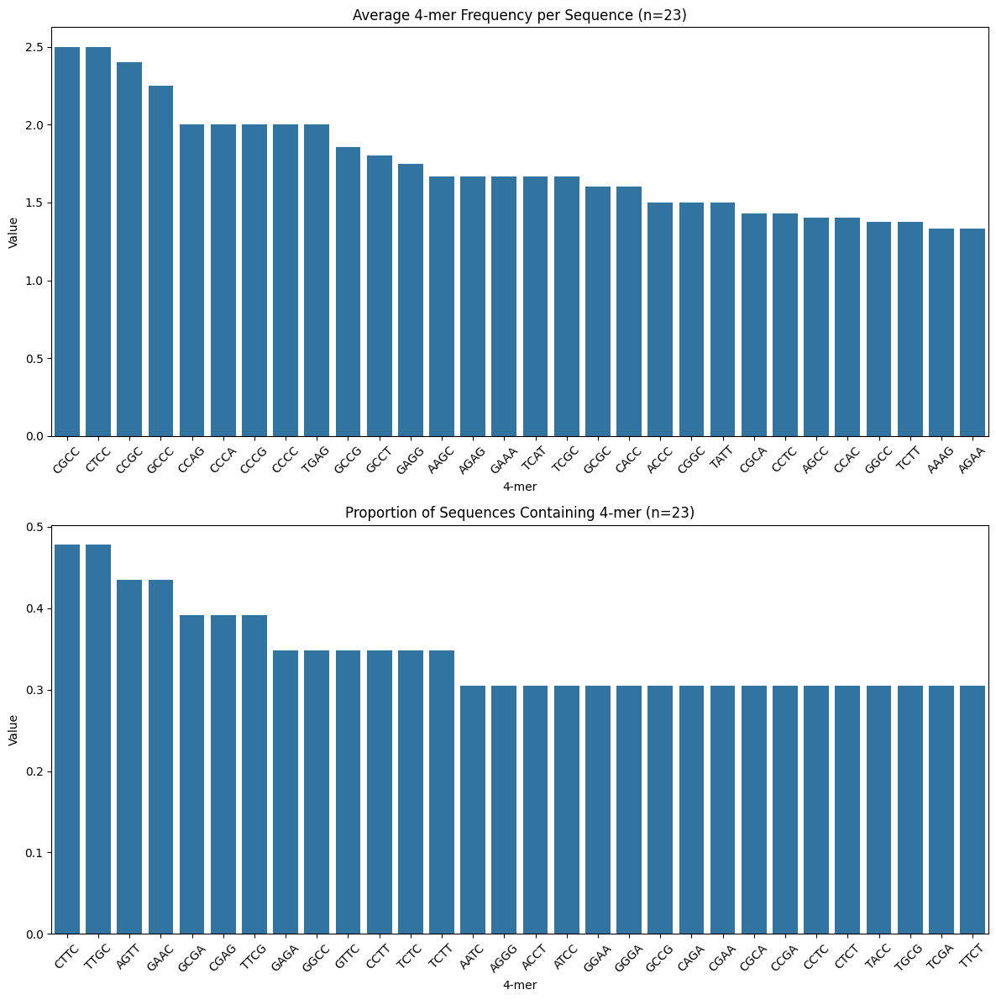

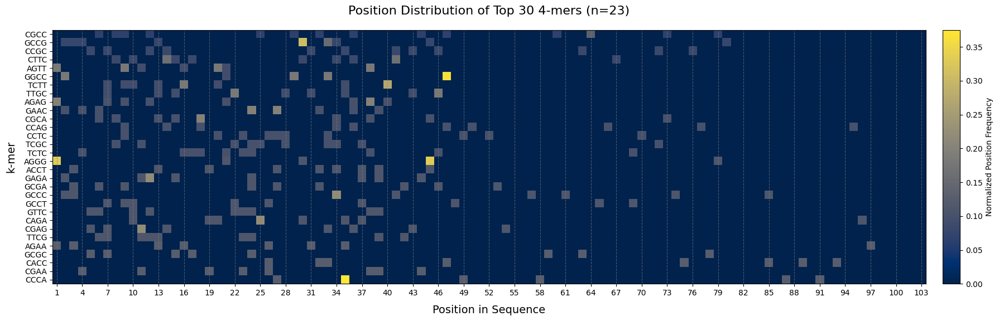

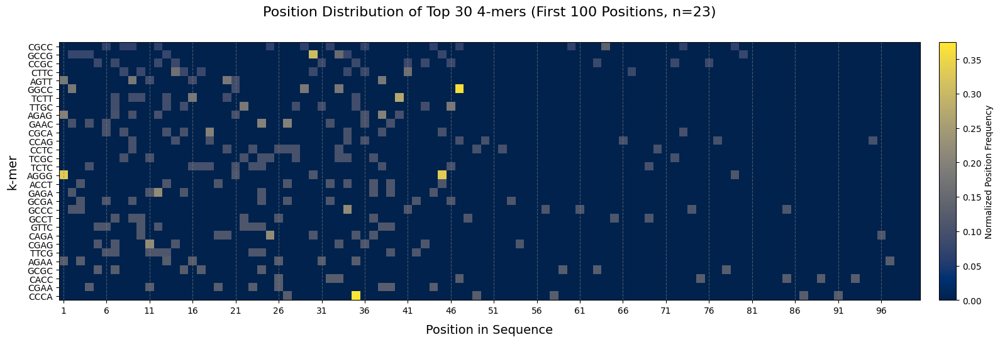

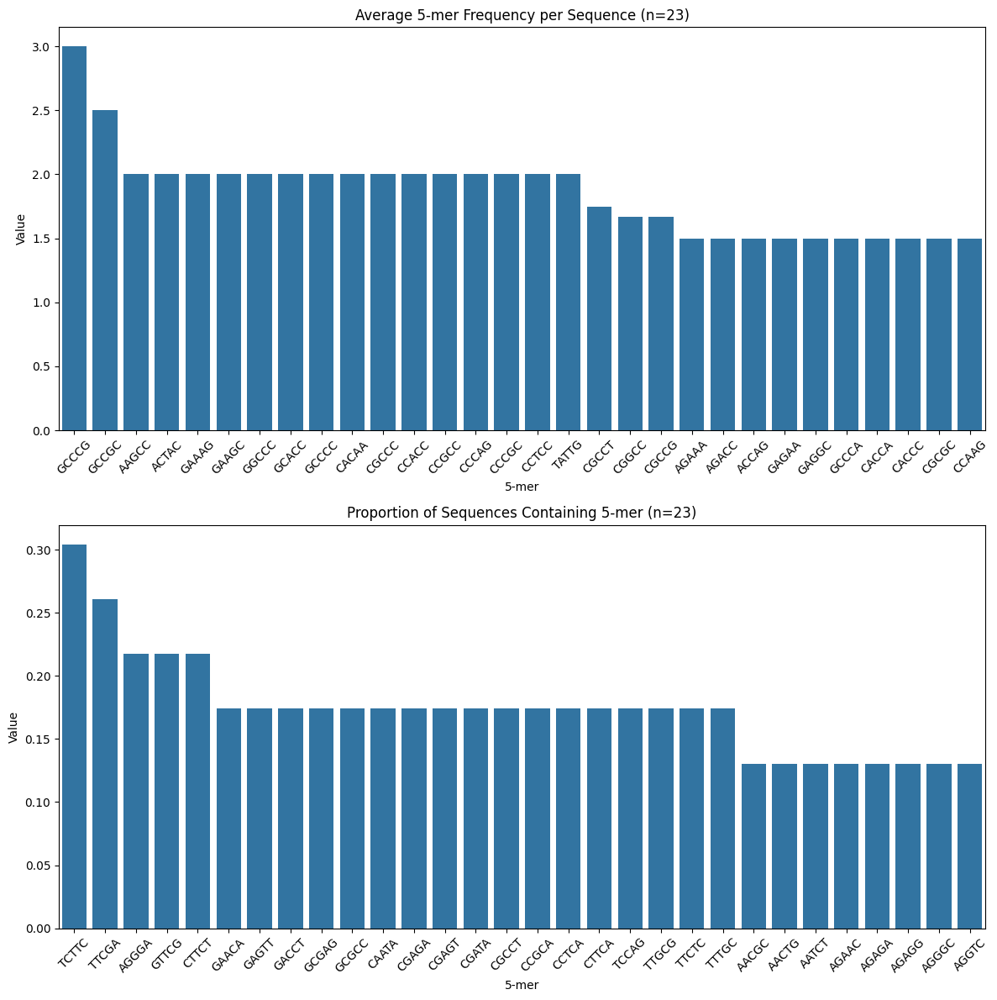

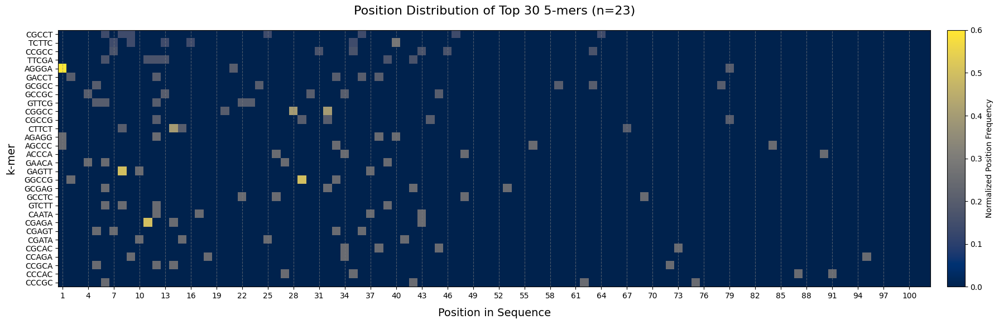

...

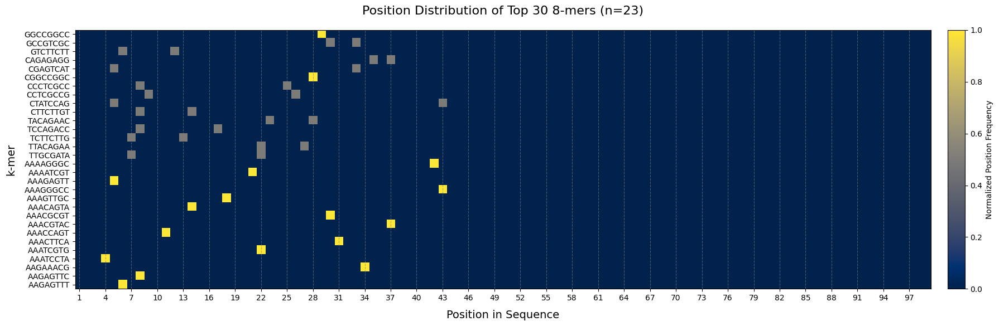

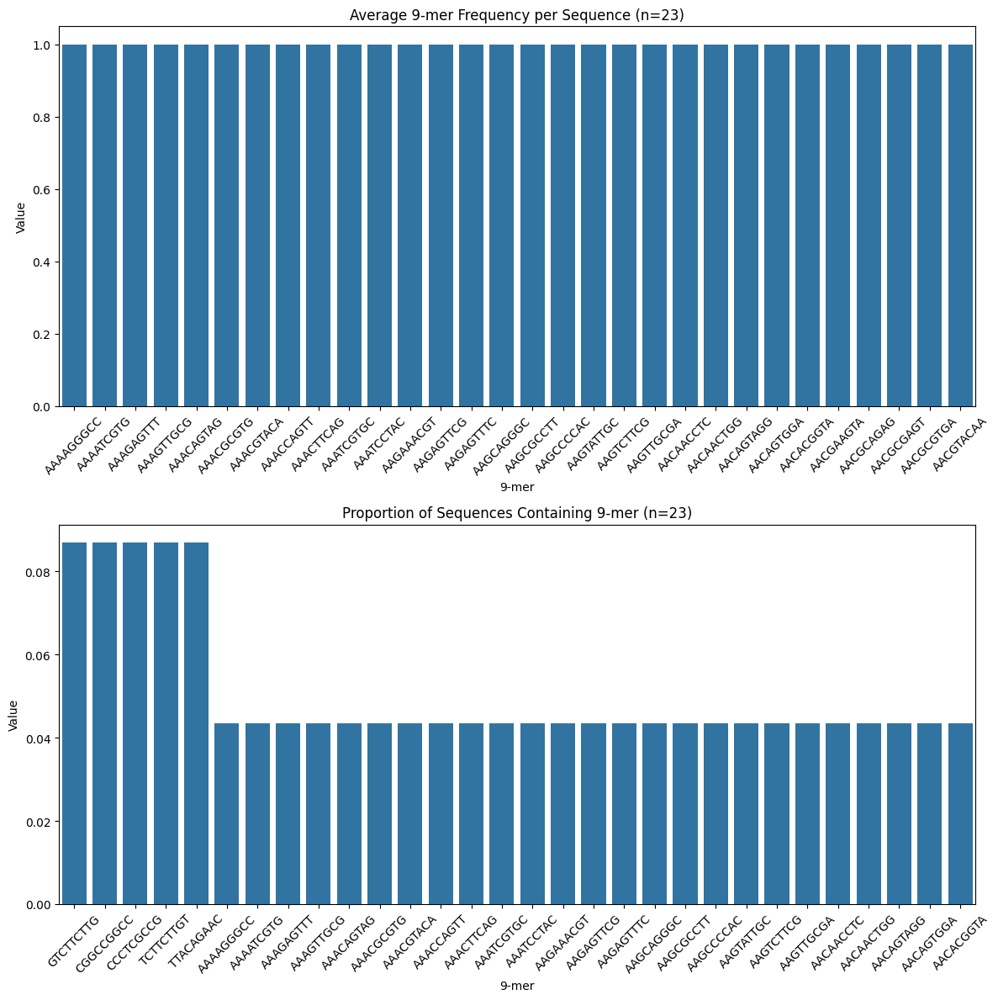

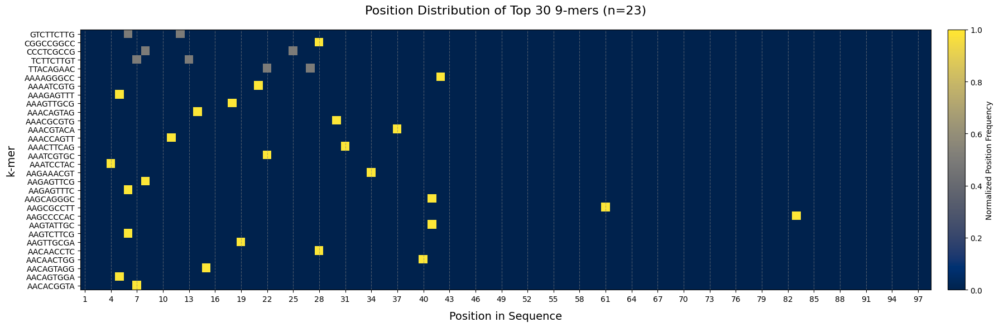

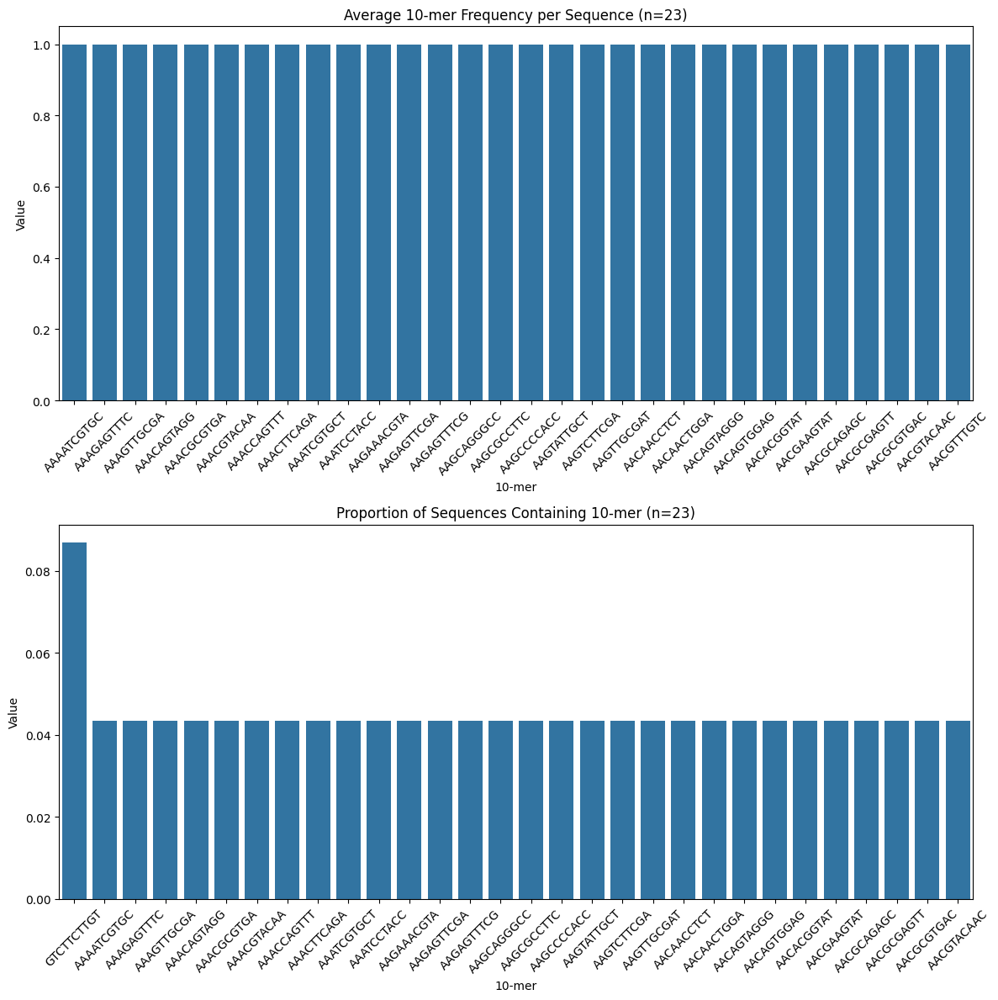

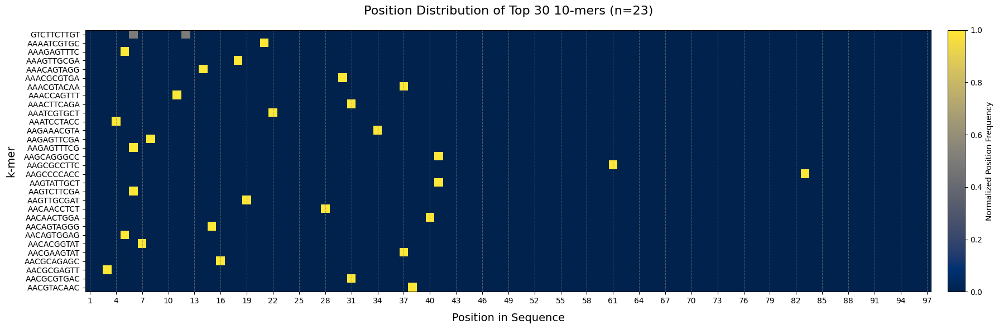

In [39]:
utr5_results = analyze_utrs(utr5_195_top50, k_range=(4, 11), save_dir = './RESULT_utr5_195_top50')

In [ ]:
utr5_results = analyze_utrs(utr5_9, k_range=(4, 11), save_dir = './RESULT_utr5_9')

分析 4-mers...
k=4, count=256
计算k-mer在多少个序列中出现的比例...
计算每个序列中k-mer的平均出现次数...
计算k-mer占所有可能位置的比例...
分析 5-mers...
k=5, count=1024
计算k-mer在多少个序列中出现的比例...
计算每个序列中k-mer的平均出现次数...
计算k-mer占所有可能位置的比例...
分析 6-mers...
k=6, count=4096
计算k-mer在多少个序列中出现的比例...
计算每个序列中k-mer的平均出现次数...
计算k-mer占所有可能位置的比例...
分析 7-mers...
k=7, count=16384
计算k-mer在多少个序列中出现的比例...
计算每个序列中k-mer的平均出现次数...
计算k-mer占所有可能位置的比例...
分析 8-mers...
k=8, count=65536
计算k-mer在多少个序列中出现的比例...
计算每个序列中k-mer的平均出现次数...
计算k-mer占所有可能位置的比例...
分析 9-mers...
k=9, count=262144
计算k-mer在多少个序列中出现的比例...
计算每个序列中k-mer的平均出现次数...
计算k-mer占所有可能位置的比例...
分析 10-mers...
k=10, count=1048576
计算k-mer在多少个序列中出现的比例...
计算每个序列中k-mer的平均出现次数...
计算k-mer占所有可能位置的比例...


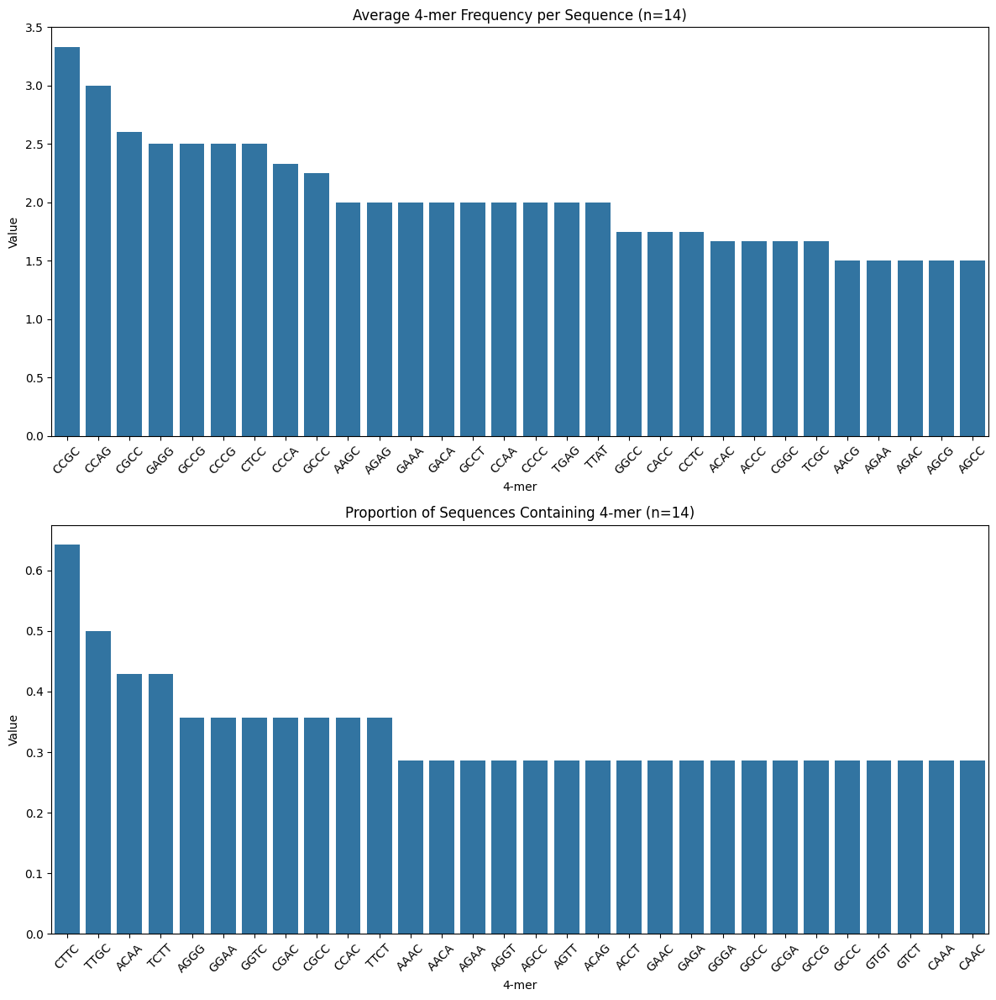

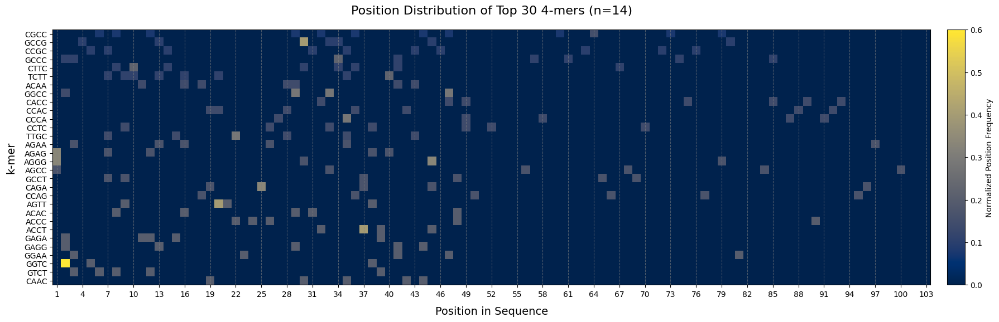

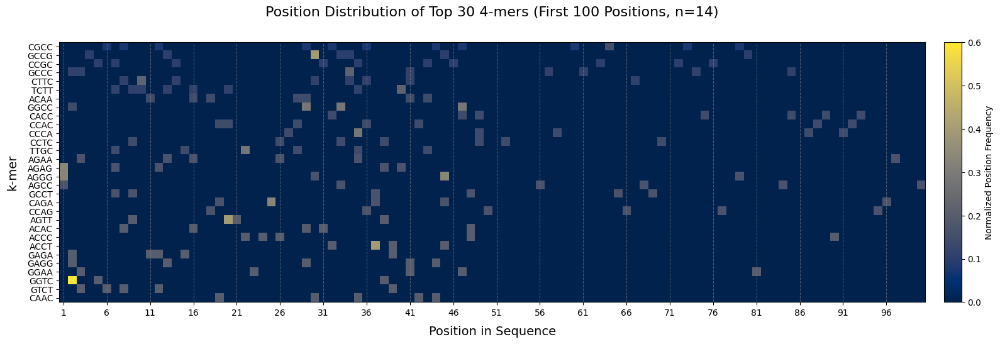

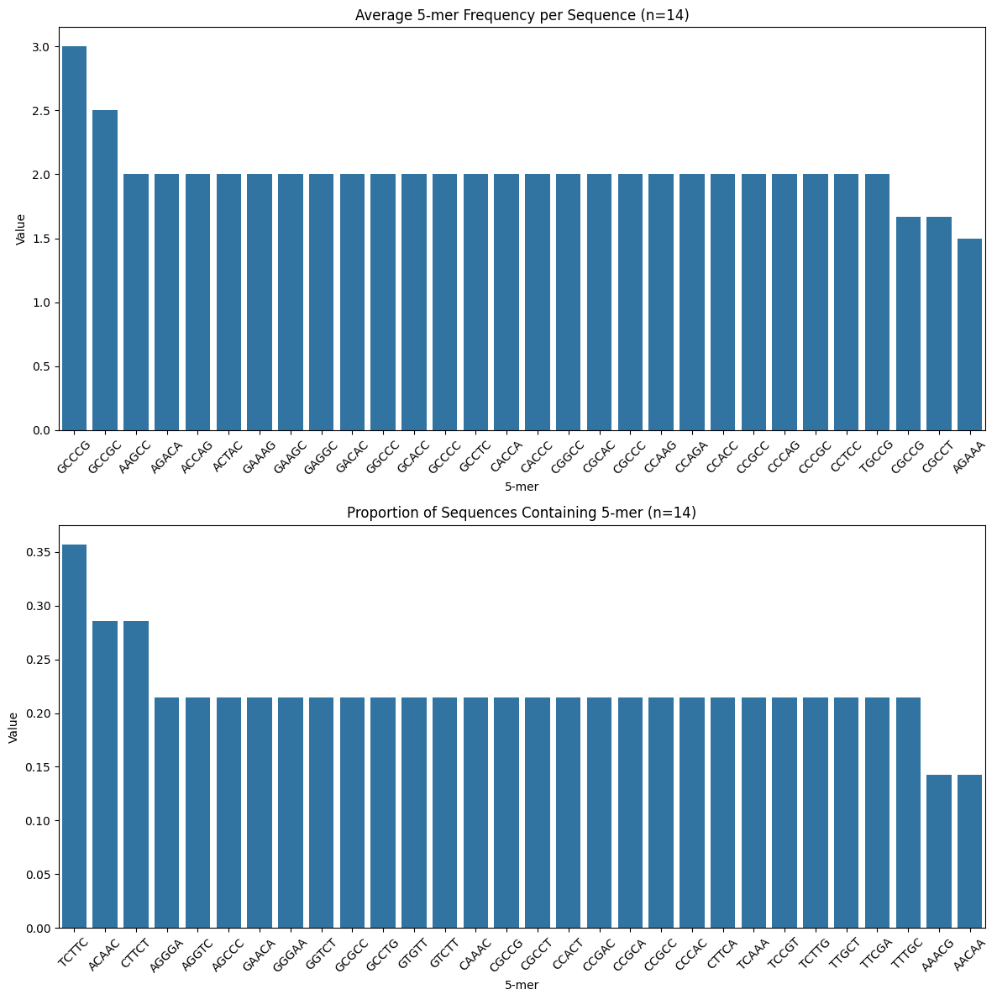

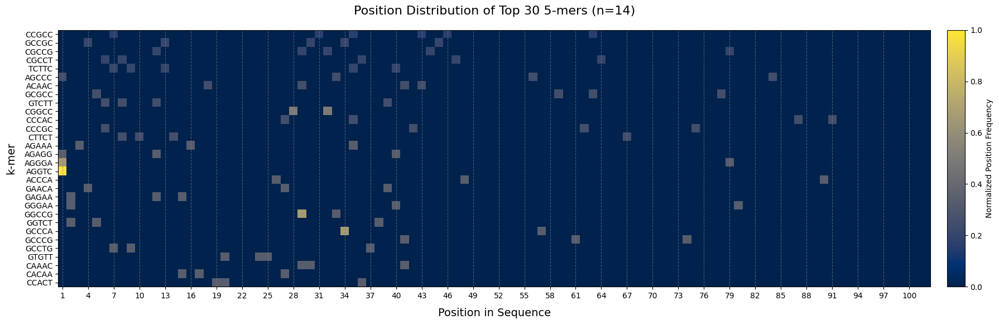

...

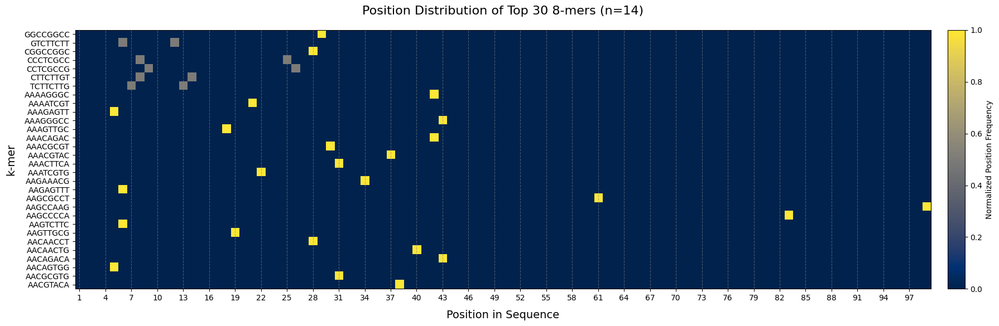

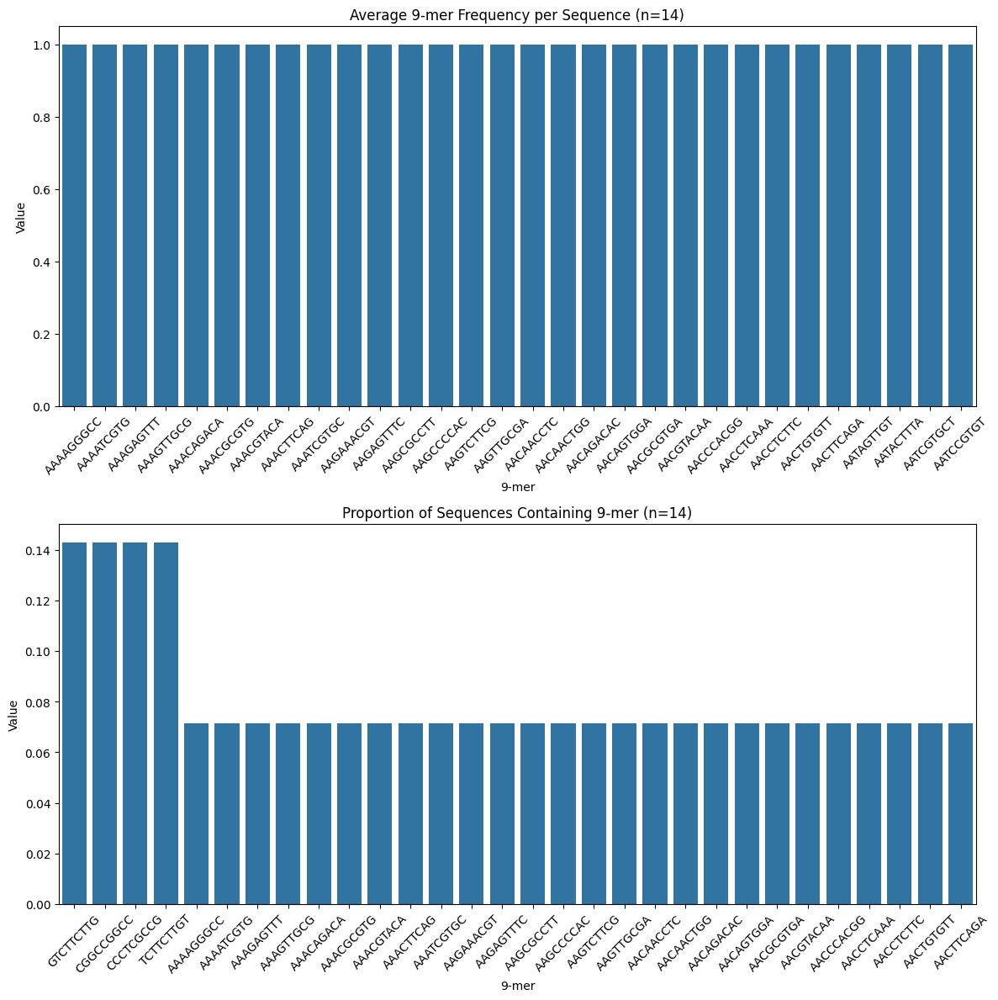

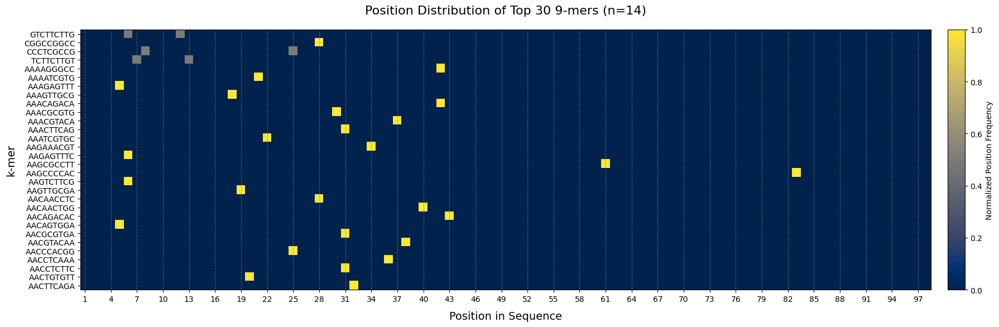

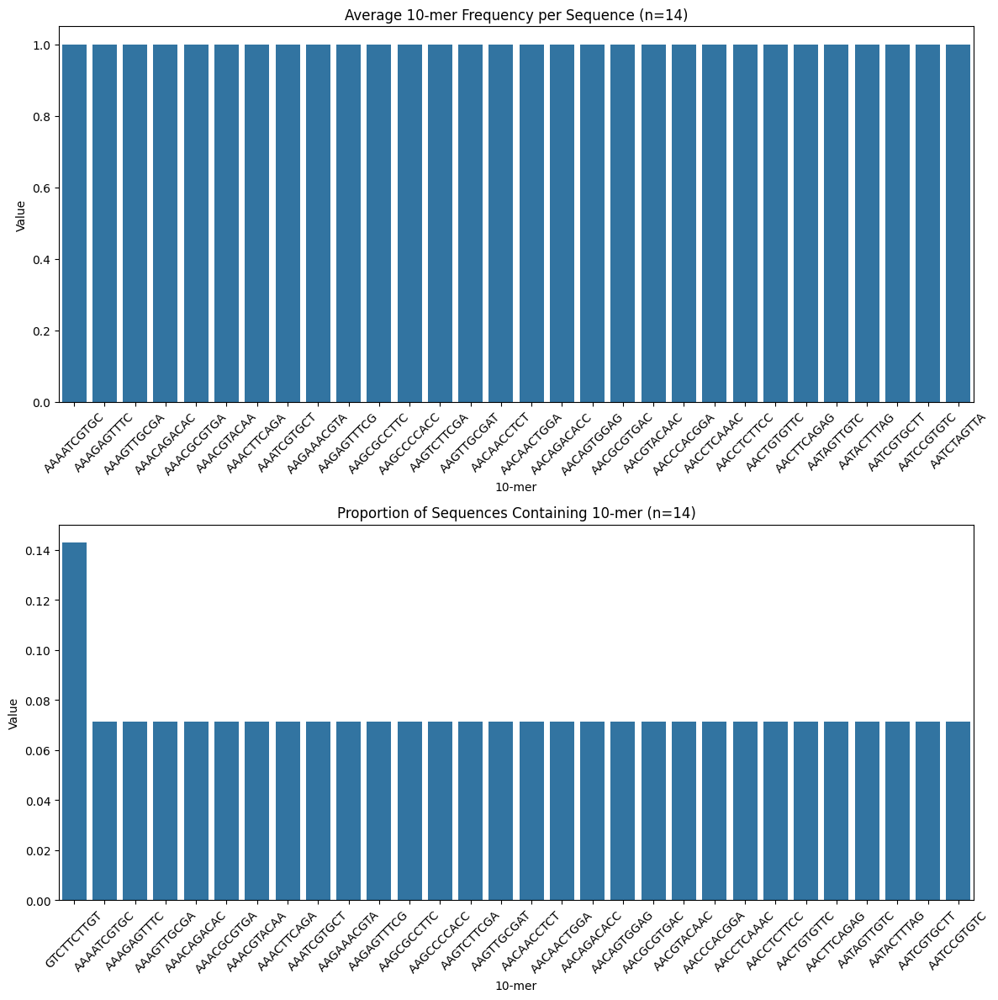

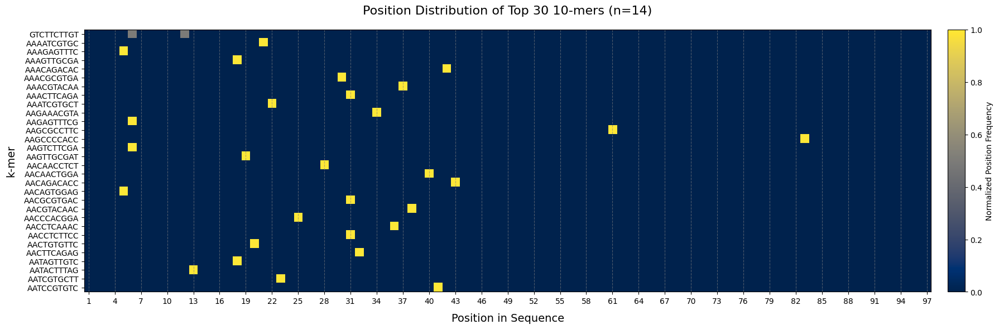

In [38]:
utr5_results = analyze_utrs(utr5_91, k_range=(4, 11), save_dir = './RESULT_utr5_91', freq_in_all = False)

In [ ]:
utr5_results = analyze_utrs(utr5_2, k_range=(4, 11), save_dir = './RESULT_utr5_2')

### UTR3

In [ ]:
utr3_results = analyze_utrs(utr3_475, k_range=(4, 11), save_dir = './RESULT_utr3_475')

In [ ]:
utr3_results = analyze_utrs(utr3_195, k_range=(4, 11), save_dir = './RESULT_utr3_195')

分析 4-mers...
k=4, count=256
计算k-mer在多少个序列中出现的比例...
计算每个序列中k-mer的平均出现次数...
计算k-mer占所有可能位置的比例...
分析 5-mers...
k=5, count=1024
计算k-mer在多少个序列中出现的比例...
计算每个序列中k-mer的平均出现次数...
计算k-mer占所有可能位置的比例...
分析 6-mers...
k=6, count=4096
计算k-mer在多少个序列中出现的比例...
计算每个序列中k-mer的平均出现次数...
计算k-mer占所有可能位置的比例...
分析 7-mers...
k=7, count=16384
计算k-mer在多少个序列中出现的比例...
计算每个序列中k-mer的平均出现次数...
计算k-mer占所有可能位置的比例...
分析 8-mers...
k=8, count=65536
计算k-mer在多少个序列中出现的比例...
计算每个序列中k-mer的平均出现次数...
计算k-mer占所有可能位置的比例...
分析 9-mers...
k=9, count=262144
计算k-mer在多少个序列中出现的比例...
计算每个序列中k-mer的平均出现次数...
计算k-mer占所有可能位置的比例...
分析 10-mers...
k=10, count=1048576
计算k-mer在多少个序列中出现的比例...
计算每个序列中k-mer的平均出现次数...
计算k-mer占所有可能位置的比例...


/tmp/ipykernel_1443515/2969543901.py:130: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(16, 10))


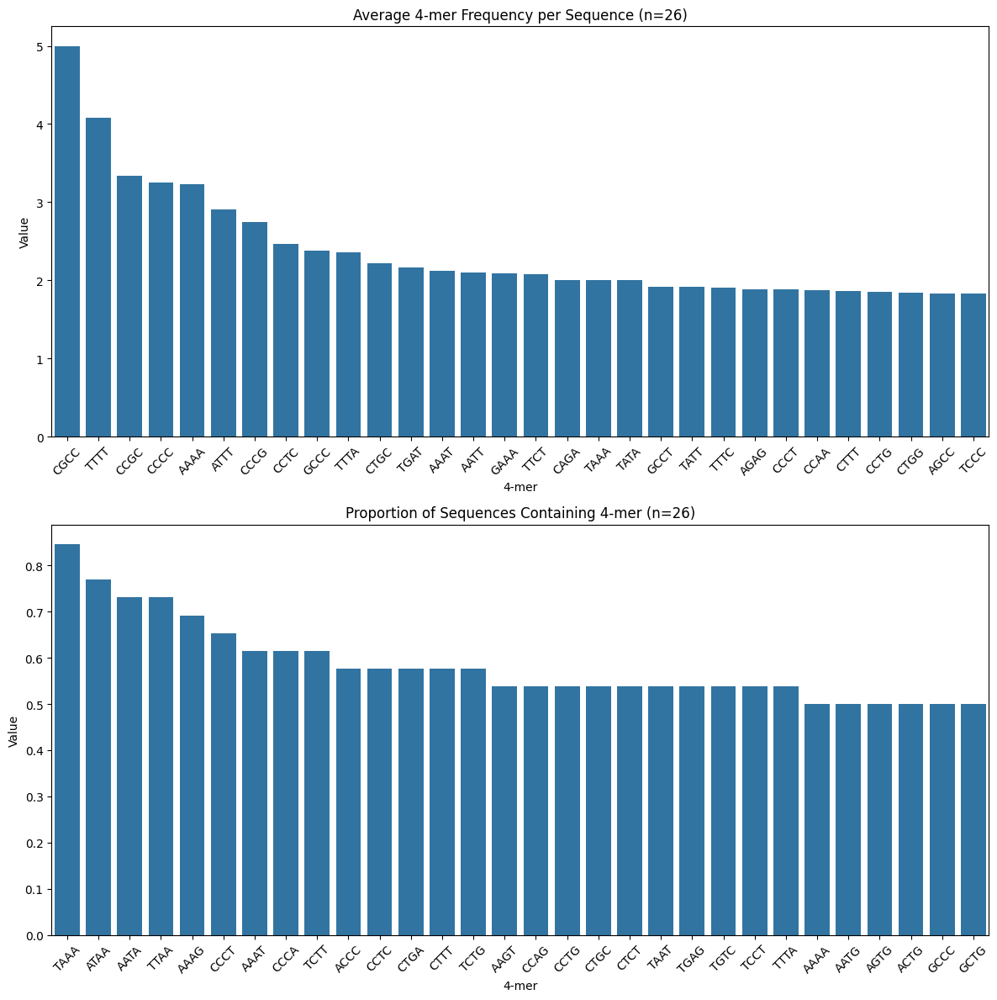

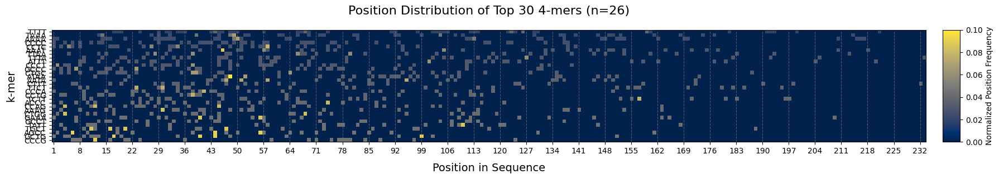

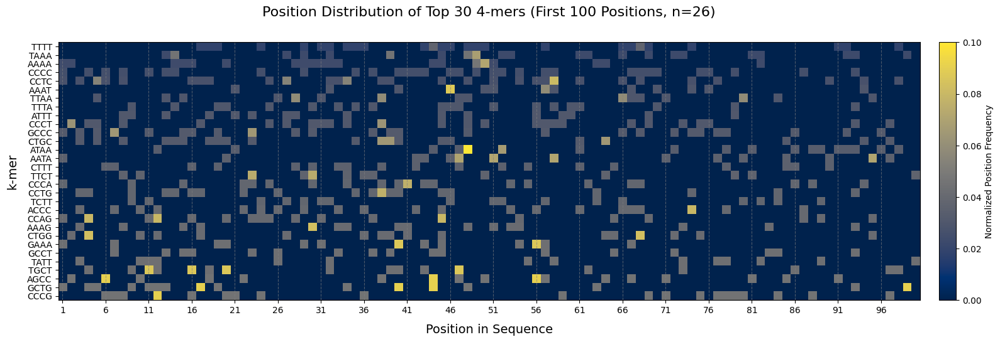

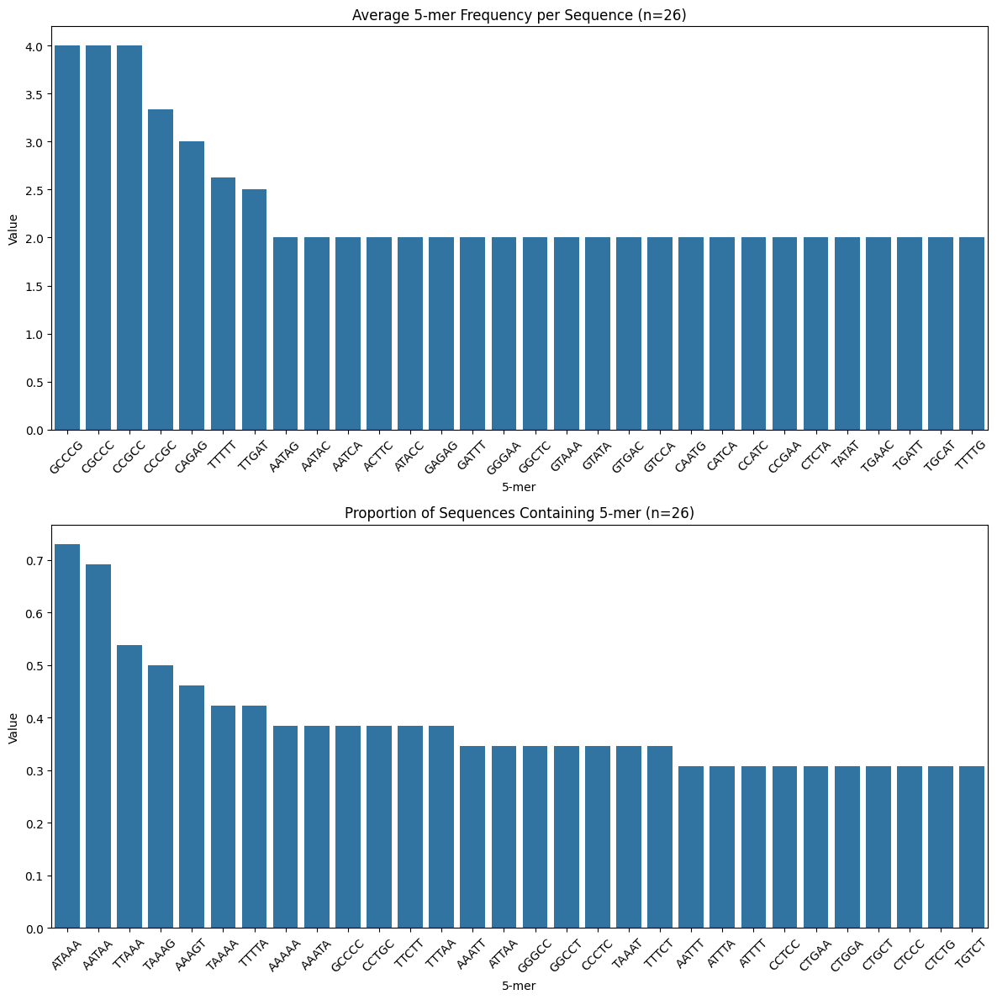

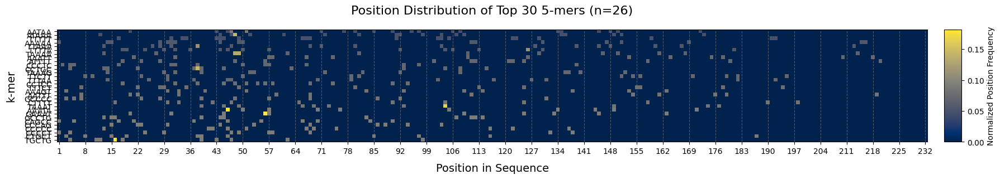

...

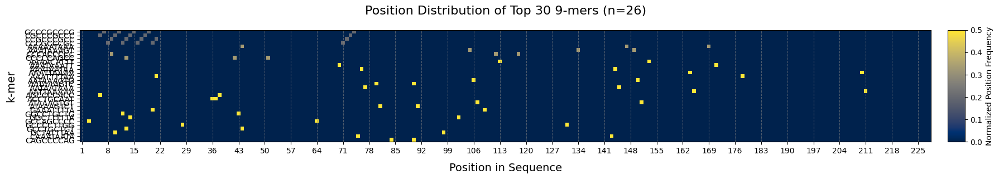

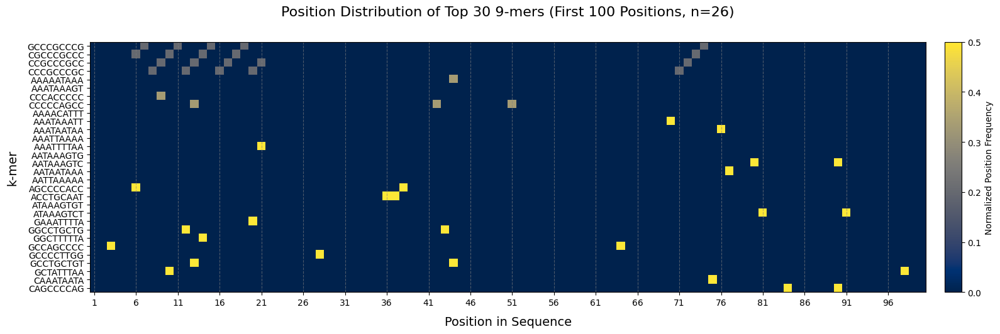

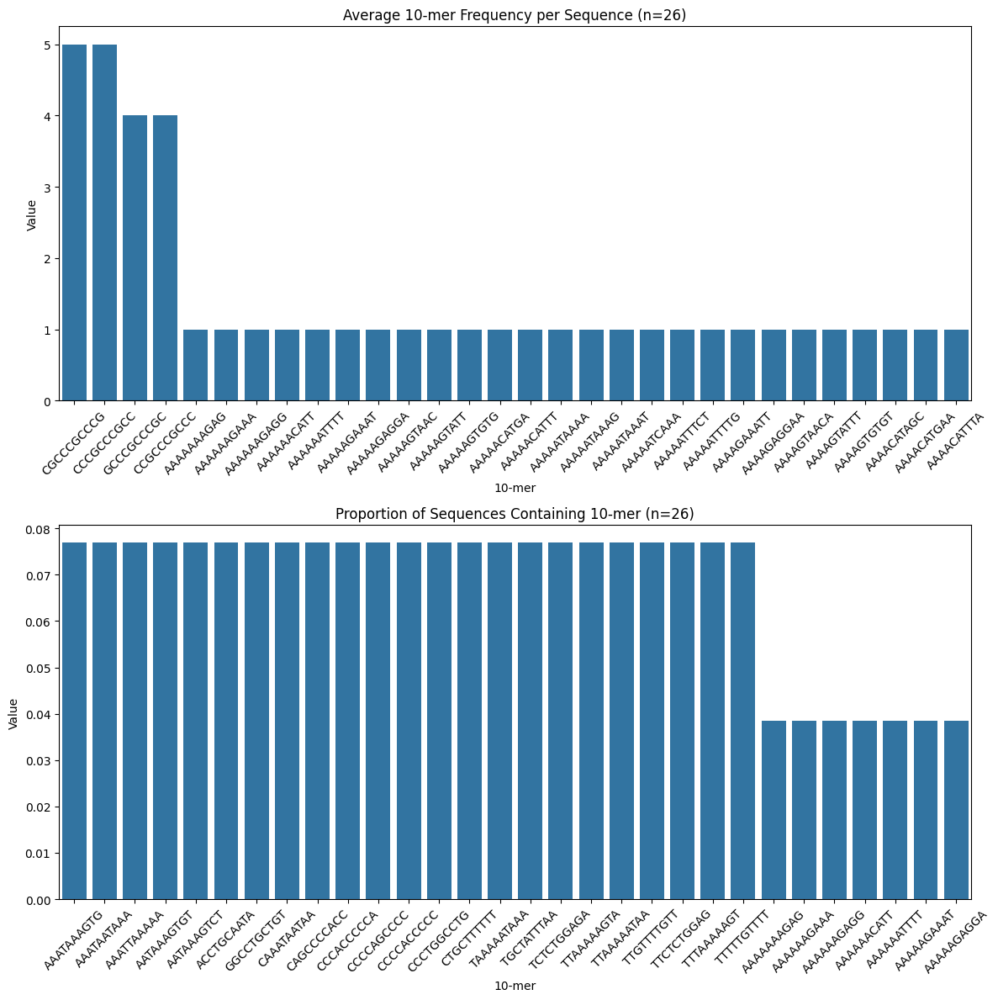

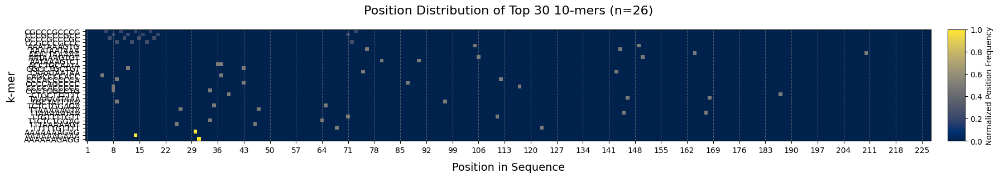

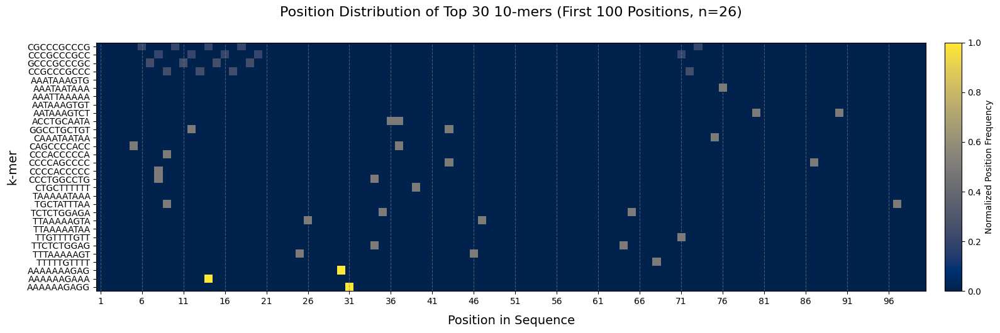

In [40]:
utr3_results = analyze_utrs(utr3_195_top50, k_range=(4, 11), save_dir = './RESULT_utr3_195_top50')

In [ ]:
utr3_results = analyze_utrs(utr3_9, k_range=(4, 11), save_dir = './RESULT_utr3_9')

分析 4-mers...
k=4, count=256
计算k-mer在多少个序列中出现的比例...
计算每个序列中k-mer的平均出现次数...
计算k-mer占所有可能位置的比例...
分析 5-mers...
k=5, count=1024
计算k-mer在多少个序列中出现的比例...
计算每个序列中k-mer的平均出现次数...
计算k-mer占所有可能位置的比例...
分析 6-mers...
k=6, count=4096
计算k-mer在多少个序列中出现的比例...
计算每个序列中k-mer的平均出现次数...
计算k-mer占所有可能位置的比例...
分析 7-mers...
k=7, count=16384
计算k-mer在多少个序列中出现的比例...
计算每个序列中k-mer的平均出现次数...
计算k-mer占所有可能位置的比例...
分析 8-mers...
k=8, count=65536
计算k-mer在多少个序列中出现的比例...
计算每个序列中k-mer的平均出现次数...
计算k-mer占所有可能位置的比例...
分析 9-mers...
k=9, count=262144
计算k-mer在多少个序列中出现的比例...
计算每个序列中k-mer的平均出现次数...
计算k-mer占所有可能位置的比例...
分析 10-mers...
k=10, count=1048576
计算k-mer在多少个序列中出现的比例...
计算每个序列中k-mer的平均出现次数...
计算k-mer占所有可能位置的比例...


/tmp/ipykernel_1443515/2969543901.py:130: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(16, 10))


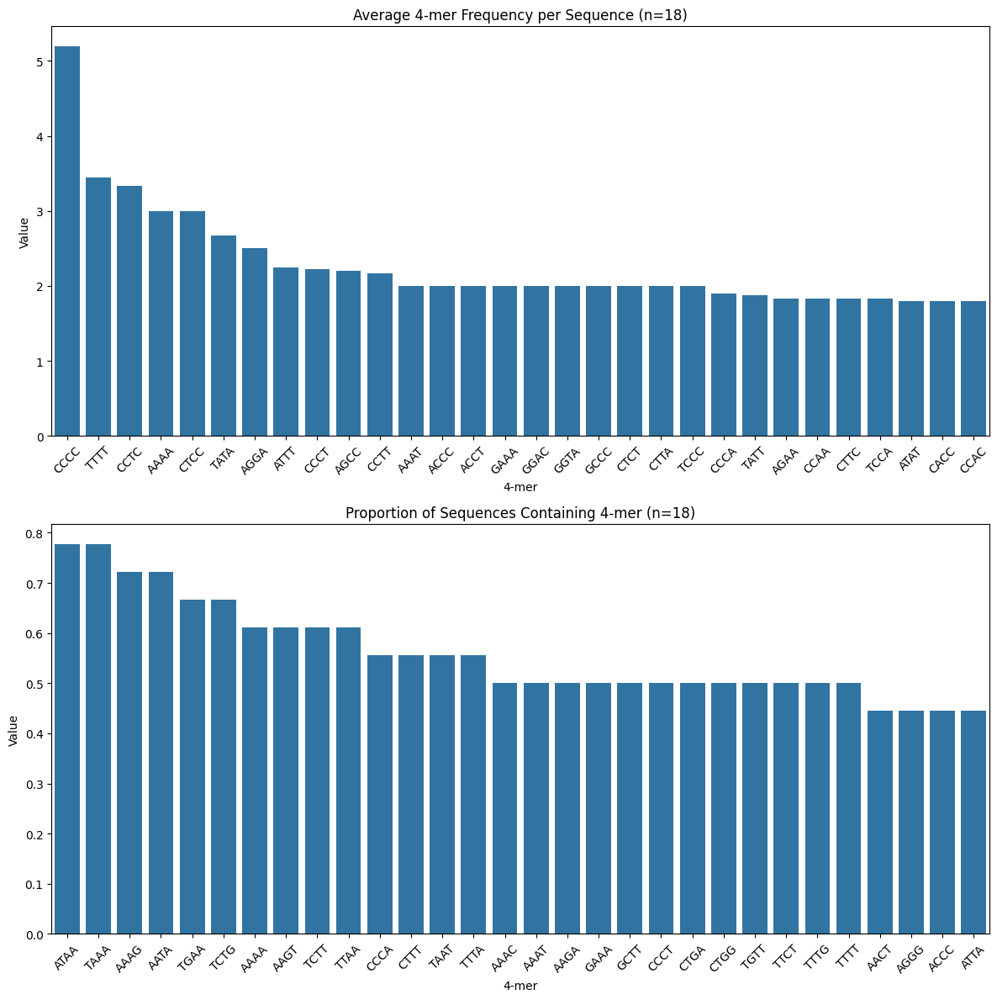

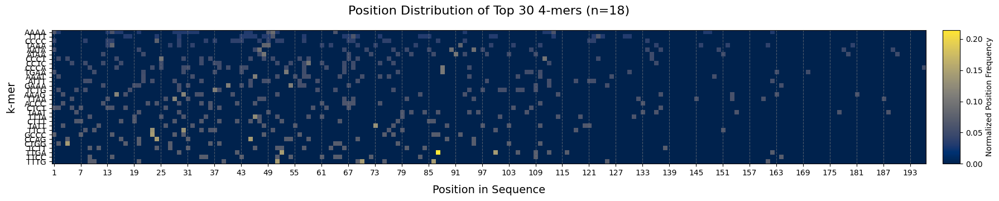

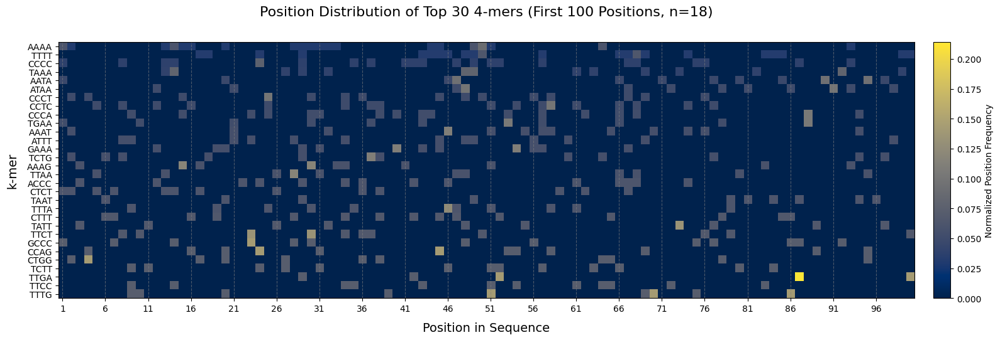

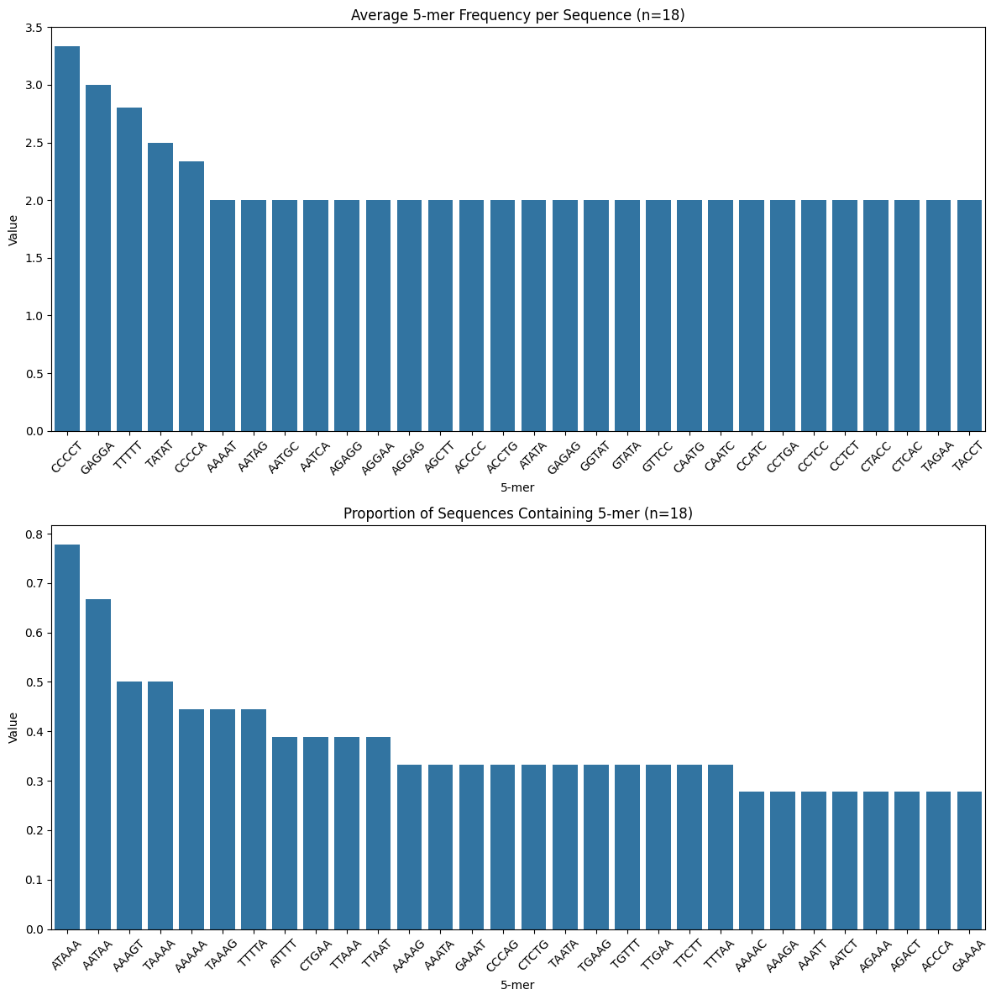

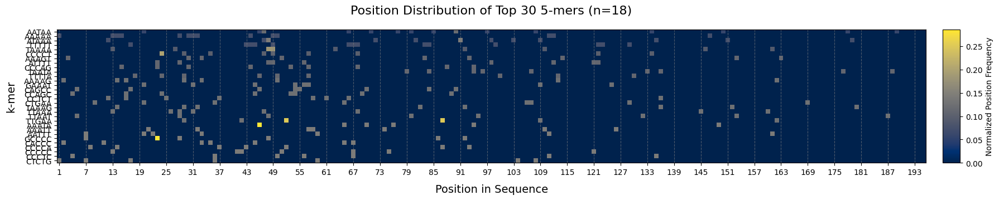

...

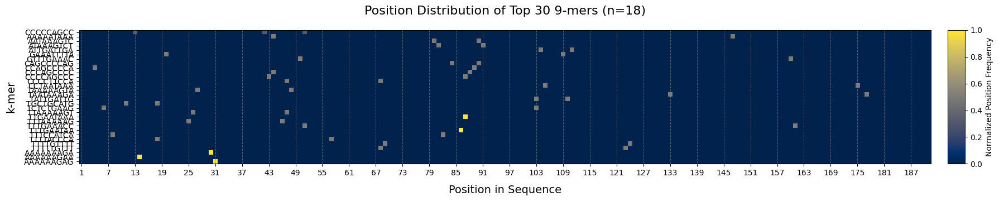

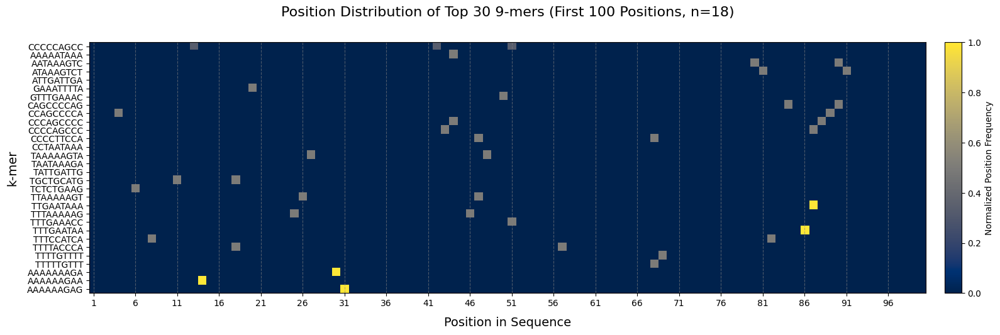

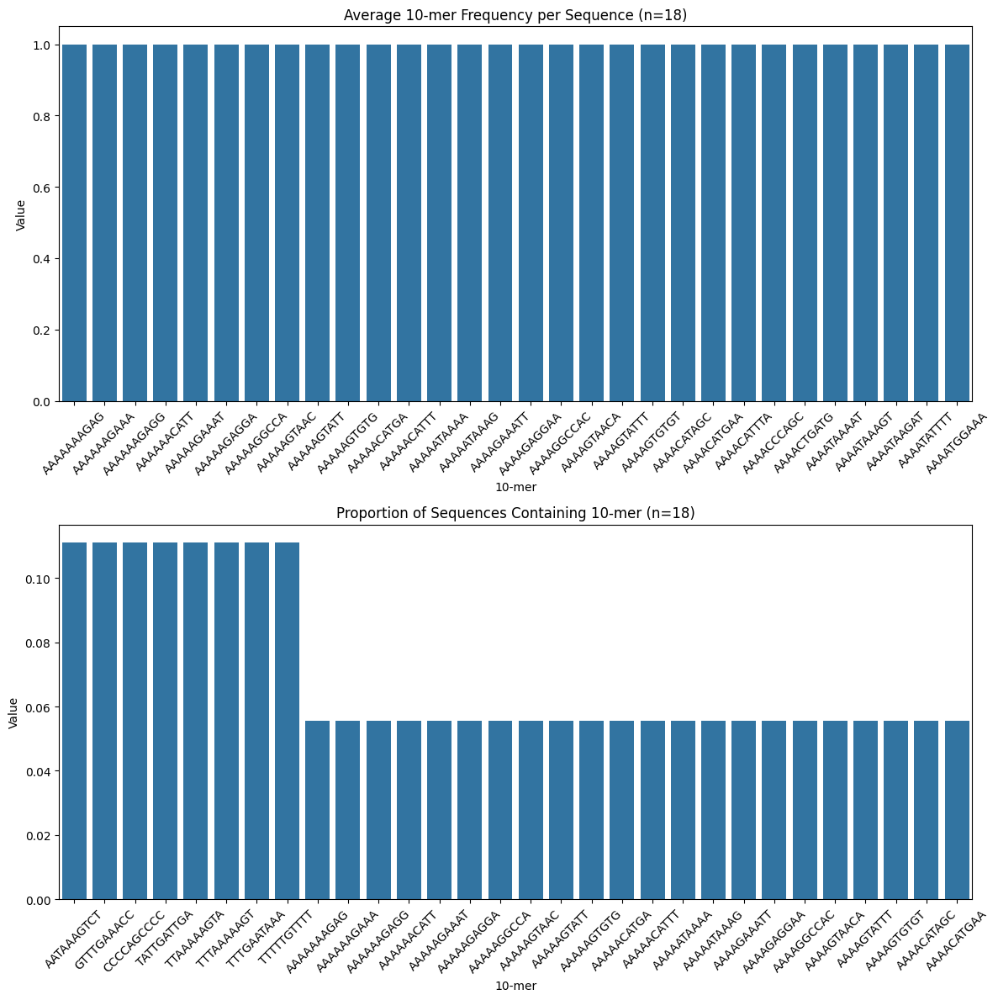

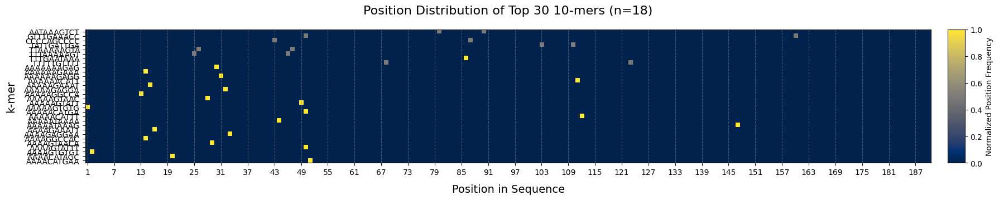

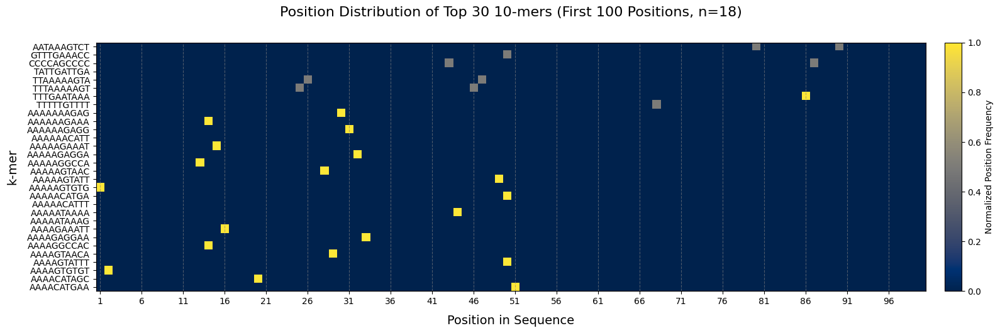

In [41]:
utr3_results = analyze_utrs(utr3_91, k_range=(4, 11), save_dir = './RESULT_utr3_91')

In [ ]:
utr3_results = analyze_utrs(utr3_91, k_range=(4, 11), save_dir = './RESULT_utr3_2')

# Grouped

In [10]:
def plot_kmer_heatmap_comparison(datasets, dataset_names, k, analysis_type='frequency', top_n=30, save_dir="./results"):
    """
    为不同数据集的相同k-mer值创建热图比较
    
    参数:
    datasets (list): 包含多个数据集序列的列表，每个元素是一个序列列表
    dataset_names (list): 数据集名称的列表，用于y轴标签
    k (int): k-mer长度
    analysis_type (str): 'frequency'或'occurrence'，指定分析类型
    top_n (int): 每个数据集要包含的top k-mer数量
    save_dir (str): 保存图片的目录
    """
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    import seaborn as sns
    from collections import Counter
    import itertools
    
    # 确保有效的分析类型
    if analysis_type not in ['frequency', 'occurrence']:
        raise ValueError("analysis_type必须是'frequency'或'occurrence'")
    
    # 为每个数据集计算k-mer分布
    dataset_results = []
    all_top_kmers = set()  # 用于收集所有数据集中的top k-mers
    
    # 生成所有可能的k-mer组合
    bases = ['A', 'G', 'C', 'T']
    all_possible_kmers = [''.join(p) for p in itertools.product(bases, repeat=k)]
    
    for i, dataset in enumerate(datasets):
        name = dataset_names[i]
        n_sequences = len(dataset)
        
        # 计算每个k-mer的频率或出现率
        if analysis_type == 'frequency':
            # 计算每个序列中k-mer的平均出现次数
            kmer_counts = {kmer: 0 for kmer in all_possible_kmers}
            
            for seq in dataset:
                if isinstance(seq, str):
                    for pos in range(len(seq) - k + 1):
                        subseq = seq[pos:pos+k]
                        if subseq in kmer_counts:
                            kmer_counts[subseq] += 1
            
            # 计算平均频率
            for kmer in kmer_counts:
                kmer_counts[kmer] /= n_sequences
        
        else:  # occurrence
            # 计算k-mer在多少个不同序列中出现
            kmer_occur = {kmer: 0 for kmer in all_possible_kmers}
            
            for seq in dataset:
                if isinstance(seq, str):
                    # 为每个序列创建一个集合，记录出现的k-mer
                    seq_kmers = set()
                    for pos in range(len(seq) - k + 1):
                        subseq = seq[pos:pos+k]
                        if subseq in kmer_occur:
                            seq_kmers.add(subseq)
                    
                    # 更新每个出现的k-mer的计数
                    for kmer in seq_kmers:
                        kmer_occur[kmer] += 1
            
            # 计算比例
            for kmer in kmer_occur:
                kmer_occur[kmer] /= n_sequences
            
            kmer_counts = kmer_occur
        
        # 获取每个数据集的top k-mers
        sorted_kmers = sorted(kmer_counts.items(), key=lambda x: x[1], reverse=True)
        dataset_top_kmers = [kmer for kmer, _ in sorted_kmers[:top_n]]
        
        # 将每个数据集的top k-mers添加到全局集合
        all_top_kmers.update(dataset_top_kmers)
        
        # 添加完整的k-mer字典到结果
        dataset_results.append((name, kmer_counts))
    
    # 对所有数据集中的top k-mers进行排序
    # 我们根据在所有数据集中的总和排序
    kmer_total_values = {}
    for kmer in all_top_kmers:
        total = 0
        for _, kmers_dict in dataset_results:
            total += kmers_dict.get(kmer, 0)
        kmer_total_values[kmer] = total
    
    # 按总值排序所有top k-mers
    sorted_all_kmers = sorted(kmer_total_values.items(), key=lambda x: x[1], reverse=True)
    combined_top_kmers = [k for k, _ in sorted_all_kmers]
    
    # 如果并集太大，可以限制显示的数量
    max_display = min(len(combined_top_kmers), 50)  # 限制最多显示50个k-mer，避免图表过大
    display_kmers = combined_top_kmers[:max_display]
    
    print(f"在所有数据集中找到 {len(combined_top_kmers)} 个唯一的Top-{top_n} k-mers，显示前 {max_display} 个")
    
    # 创建热图矩阵
    heatmap_data = np.zeros((len(dataset_names), len(display_kmers)))
    
    for i, (dataset_name, kmers_dict) in enumerate(dataset_results):
        for j, kmer in enumerate(display_kmers):
            heatmap_data[i, j] = kmers_dict.get(kmer, 0)
    
    # 创建DataFrame以便用seaborn绘制热图
    df_heatmap = pd.DataFrame(heatmap_data, 
                             index=dataset_names, 
                             columns=display_kmers)
    
    # 创建热图
    plt.figure(figsize=(min(20, len(display_kmers) * 0.6), len(dataset_names) * 0.8 + 3))
    
    # 使用更适合定量比较的颜色映射
    cmap = 'YlGnBu'
    
    # 绘制热图
    ax = sns.heatmap(df_heatmap, annot=False, fmt=".2f", cmap=cmap, 
                    linewidths=0.5, cbar_kws={'label': 'Value', 'shrink': 0.4}, square=True)
    
    # 设置标题和标签
    if analysis_type == 'frequency':
        title = f"Average {k}-mer Frequency per Sequence Across Datasets (Found {len(combined_top_kmers)} unique Top-{top_n} {k}-mers, showing top {max_display})"
        cbar_label = "Average Frequency"
    else:
        title = f"Proportion of Sequences Containing {k}-mer Across Datasets (Found {len(combined_top_kmers)} unique Top-{top_n} {k}-mers, showing top {max_display})"
        cbar_label = "Proportion of Sequences"
    
    plt.title(title, fontsize=16, pad=20)
    plt.ylabel("Dataset", fontsize=14, labelpad=10)
    # plt.xlabel(f'{k}-mer', fontsize=14, labelpad=10)
    
    # 调整x轴标签
    plt.xticks(rotation=90, ha='right')
    
    # 更新颜色条标签
    cbar = ax.collections[0].colorbar
    cbar.set_label(cbar_label, fontsize = 12)
    
    # 调整布局并保存
    plt.tight_layout()
    plt.savefig(f"{save_dir}/vMay11_heatmap_comparison_{k}mers_{analysis_type}.pdf", dpi=300, bbox_inches='tight')
    
    # 创建带有标准化颜色的热图（每行归一化）
    plt.figure(figsize=(min(20, len(display_kmers) * 0.6), len(dataset_names) * 0.8 + 3))
    
    # 对每个数据集（行）进行归一化
    normalized_data = np.zeros_like(heatmap_data)
    for i in range(heatmap_data.shape[0]):
        row_max = heatmap_data[i].max()
        if row_max > 0:
            normalized_data[i] = heatmap_data[i] / row_max
    
    df_norm = pd.DataFrame(normalized_data, 
                          index=dataset_names, 
                          columns=display_kmers)
    
    # 绘制归一化热图
    ax_norm = sns.heatmap(df_norm, annot=False, fmt=".2f", cmap=cmap, 
                         linewidths=0.5, cbar_kws={'label': 'Normalized Value', 'shrink': 0.4}, square=True)
    
    # 设置标题和标签
    if analysis_type == 'frequency':
        norm_title = f"Normalized Average {k}-mer Frequency (Found {len(combined_top_kmers)} unique Top-{top_n} {k}-mers, showing top {max_display})"
    else:
        norm_title = f"Normalized Proportion of Sequences Containing {k}-mer (Found {len(combined_top_kmers)} unique Top-{top_n} {k}-mers, showing top {max_display})"

    
    plt.title(norm_title, fontsize=16, pad=20)
    plt.ylabel("Dataset", fontsize=14, labelpad=10)
    # plt.xlabel(f'{k}-mer', fontsize=14, labelpad=10)
    
    # 调整x轴标签
    plt.xticks(rotation=90, ha='right')
    
    # 更新颜色条标签
    cbar_norm = ax_norm.collections[0].colorbar
    cbar_norm.set_label('Normalized Value (per dataset)', fontsize = 12)
    
    # 调整布局并保存
    plt.tight_layout()
    plt.savefig(f"{save_dir}/vMay11_heatmap_comparison_{k}mers_{analysis_type}_normalized.pdf", dpi=300, bbox_inches='tight')
    
    return df_heatmap, df_norm  # 返回原始和归一化的数据框，以便进一步分析

# UTR5

In [11]:
# 假设你已经有了所有的数据集
datasets = [utr5_475, utr5_195, utr5_195_top50, utr5_9, utr5_91, utr5_2]
datasets_num = [len(d) for d in datasets]
print(datasets_num)
dataset_names = ['UTR5-475 (n=216)', 
                 'UTR5-195 (n=123)', 
                 'UTR5-195-top50 (n=23)', 
                 'UTR5-9 (n=9)', 
                 'UTR5-91 (n=14)',
                 'UTR5-2 (n=2)',
                 ]

[216, 123, 23, 9, 14, 2]


在所有数据集中找到 69 个唯一的Top-30 k-mers，显示前 50 个
在所有数据集中找到 91 个唯一的Top-30 k-mers，显示前 50 个
在所有数据集中找到 99 个唯一的Top-30 k-mers，显示前 50 个
在所有数据集中找到 108 个唯一的Top-30 k-mers，显示前 50 个
在所有数据集中找到 92 个唯一的Top-30 k-mers，显示前 50 个
在所有数据集中找到 87 个唯一的Top-30 k-mers，显示前 50 个
在所有数据集中找到 90 个唯一的Top-30 k-mers，显示前 50 个
在所有数据集中找到 71 个唯一的Top-30 k-mers，显示前 50 个
在所有数据集中找到 95 个唯一的Top-30 k-mers，显示前 50 个
在所有数据集中找到 107 个唯一的Top-30 k-mers，显示前 50 个
在所有数据集中找到 106 个唯一的Top-30 k-mers，显示前 50 个


/tmp/ipykernel_3572000/2681195904.py:117: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(min(20, len(display_kmers) * 0.6), len(dataset_names) * 0.8 + 3))


在所有数据集中找到 94 个唯一的Top-30 k-mers，显示前 50 个
在所有数据集中找到 88 个唯一的Top-30 k-mers，显示前 50 个
在所有数据集中找到 90 个唯一的Top-30 k-mers，显示前 50 个


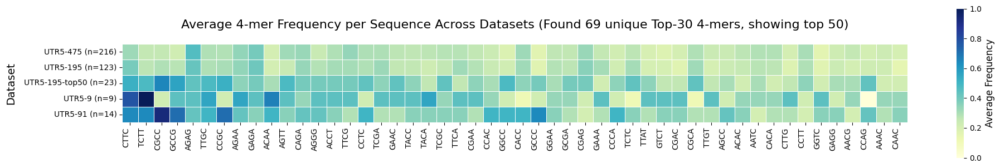

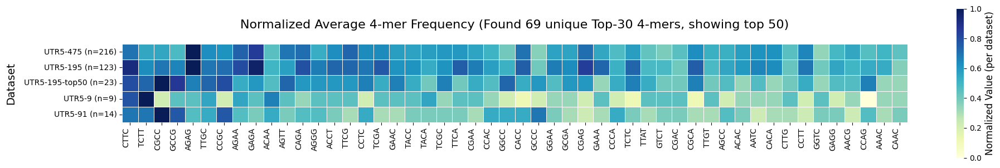

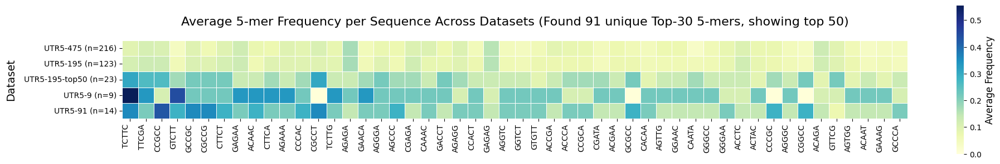

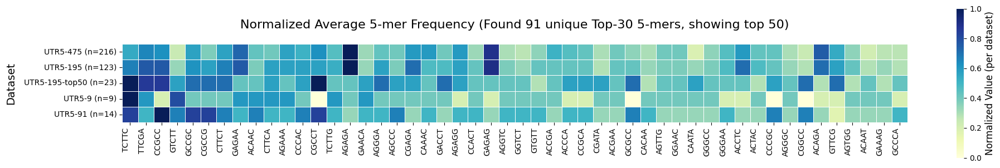

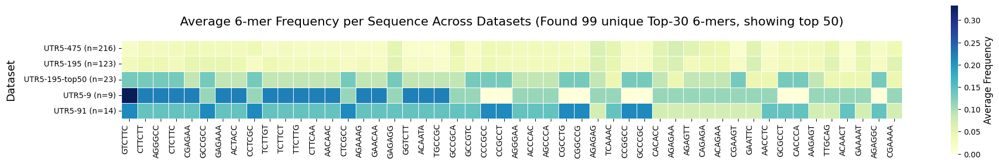

...

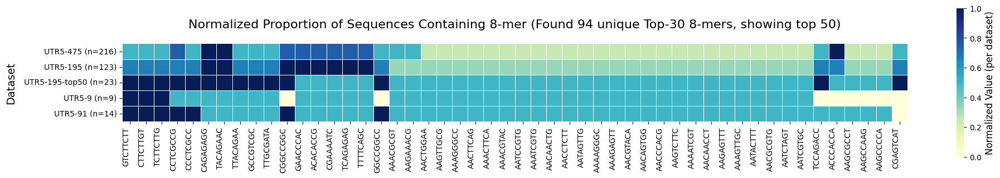

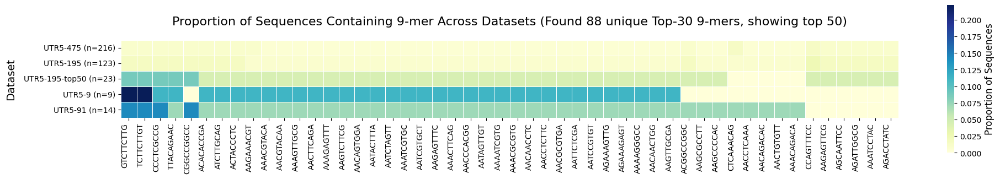

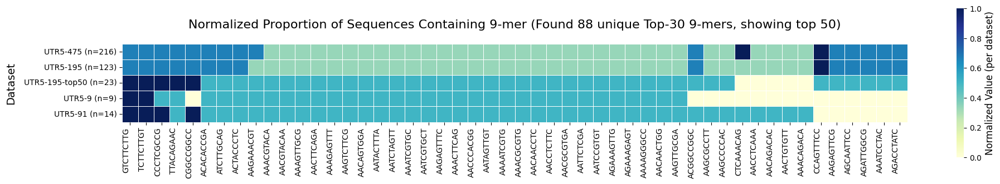

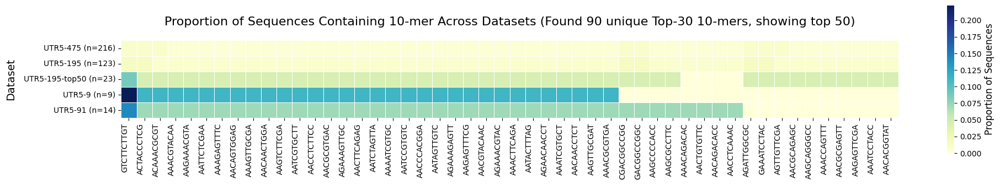

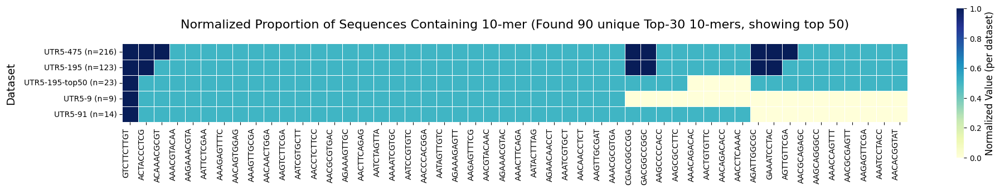

In [13]:
# 对比频率分布热图
for k in range(4, 11):
    plot_kmer_heatmap_comparison(
        datasets[:-1], 
        dataset_names[:-1], 
        k, 
        analysis_type='frequency', 
        top_n=30, 
        save_dir="./RESULT_5UTR_noN2"
    )

# 对比序列包含率热图
for k in range(4, 11):
    plot_kmer_heatmap_comparison(
        datasets[:-1], 
        dataset_names[:-1], 
        k, 
        analysis_type='occurrence', 
        top_n=30, 
        save_dir="./RESULT_5UTR_noN2"
    )

In [ ]:
# 对比频率分布热图
for k in range(4, 11):
    plot_kmer_heatmap_comparison(
        datasets, 
        dataset_names, 
        k, 
        analysis_type='frequency', 
        top_n=30, 
        save_dir="./RESULT_5UTR"
    )

# 对比序列包含率热图
for k in range(4, 11):
    plot_kmer_heatmap_comparison(
        datasets, 
        dataset_names, 
        k, 
        analysis_type='occurrence', 
        top_n=30, 
        save_dir="./RESULT_5UTR"
    )

# UTR3

In [14]:
datasets = [utr3_475, utr3_195, utr3_195_top50, utr3_9, utr3_91, utr3_2]
datasets_num = [len(d) for d in datasets]
print(datasets_num)
dataset_names = ['UTR3-475 (n=110)', 
                 'UTR3-195 (n=59)', 
                 'UTR3-195-top50 (n=26)', 
                 'UTR3-9 (n=9)', 
                 'UTR3-91 (n=18)',
                 'UTR3-2 (n=2)']

[110, 59, 26, 9, 18, 2]


在所有数据集中找到 51 个唯一的Top-30 k-mers，显示前 50 个
在所有数据集中找到 57 个唯一的Top-30 k-mers，显示前 50 个
在所有数据集中找到 65 个唯一的Top-30 k-mers，显示前 50 个
在所有数据集中找到 85 个唯一的Top-30 k-mers，显示前 50 个
在所有数据集中找到 88 个唯一的Top-30 k-mers，显示前 50 个
在所有数据集中找到 96 个唯一的Top-30 k-mers，显示前 50 个
在所有数据集中找到 100 个唯一的Top-30 k-mers，显示前 50 个
在所有数据集中找到 61 个唯一的Top-30 k-mers，显示前 50 个
在所有数据集中找到 66 个唯一的Top-30 k-mers，显示前 50 个
在所有数据集中找到 66 个唯一的Top-30 k-mers，显示前 50 个
在所有数据集中找到 79 个唯一的Top-30 k-mers，显示前 50 个


/tmp/ipykernel_3572000/2681195904.py:117: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(min(20, len(display_kmers) * 0.6), len(dataset_names) * 0.8 + 3))


在所有数据集中找到 90 个唯一的Top-30 k-mers，显示前 50 个
在所有数据集中找到 99 个唯一的Top-30 k-mers，显示前 50 个
在所有数据集中找到 101 个唯一的Top-30 k-mers，显示前 50 个


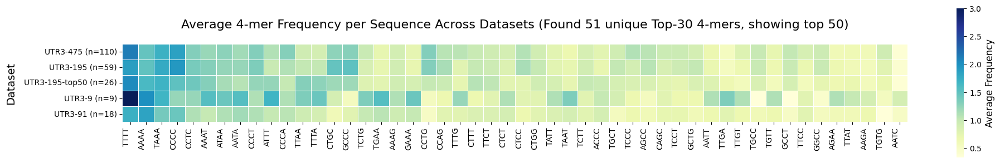

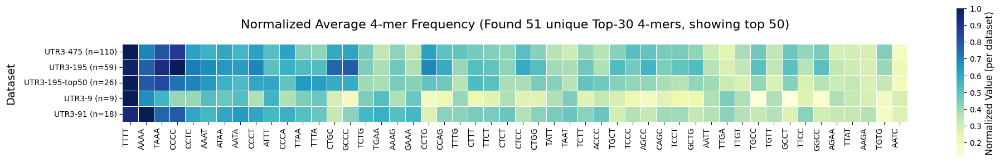

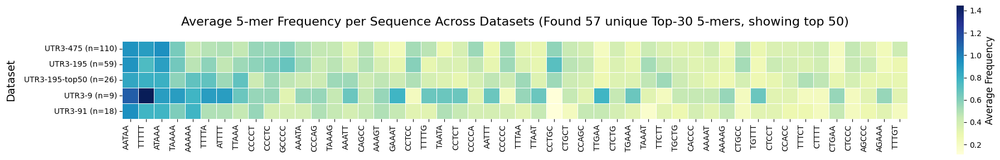

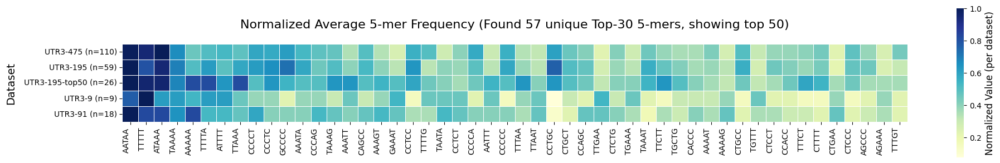

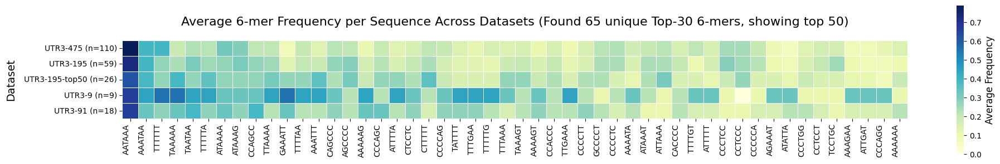

...

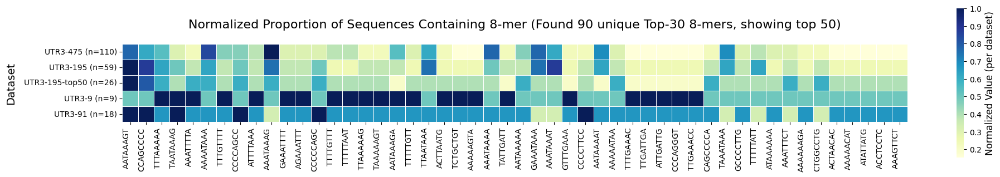

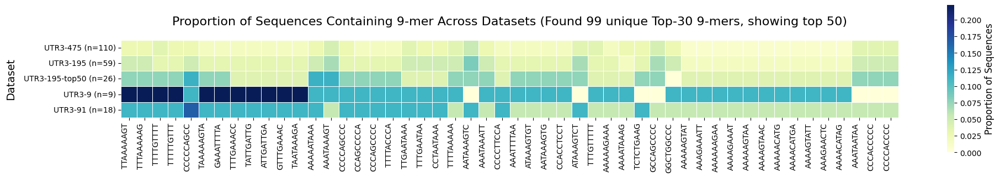

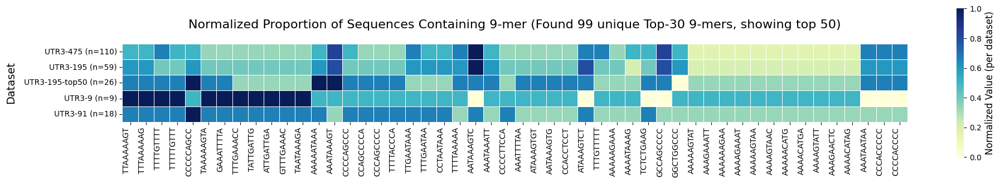

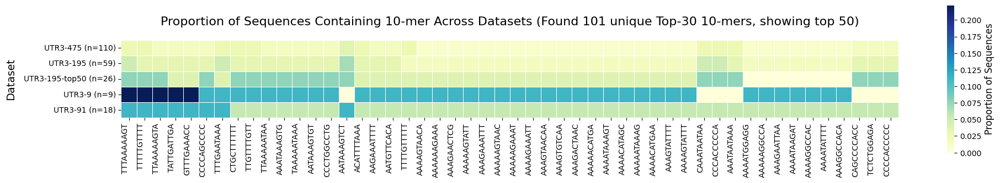

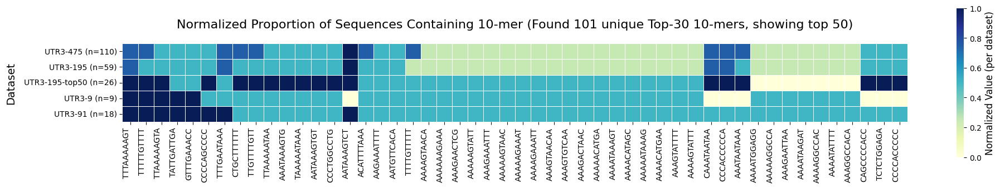

In [15]:
# 对比频率分布热图
for k in range(4, 11):
    plot_kmer_heatmap_comparison(
        datasets[:-1], 
        dataset_names[:-1], 
        k, 
        analysis_type='frequency', 
        top_n=30, 
        save_dir="./RESULT_3UTR_noN2"
    )

# 对比序列包含率热图
for k in range(4, 11):
    plot_kmer_heatmap_comparison(
        datasets[:-1], 
        dataset_names[:-1], 
        k, 
        analysis_type='occurrence', 
        top_n=30, 
        save_dir="./RESULT_3UTR_noN2"
    )

In [ ]:
# 对比频率分布热图
for k in range(4, 11):
    plot_kmer_heatmap_comparison(
        datasets, 
        dataset_names, 
        k, 
        analysis_type='frequency', 
        top_n=30, 
        save_dir="./RESULT_3UTR"
    )

# 对比序列包含率热图
for k in range(4, 11):
    plot_kmer_heatmap_comparison(
        datasets, 
        dataset_names, 
        k, 
        analysis_type='occurrence', 
        top_n=30, 
        save_dir="./RESULT_3UTR"
    )